# LDV Cable Coupling Analysis — Sweep Experiment

**Research goal:** Measure the strain transfer efficiency η = δx_l / δL for fibre-optic cables hanging
freely between two clamped contact points, and compare the result across
- different cable types (mechanical properties)
- different gap lengths L (5 cm, 10 cm, 15 cm)

The experiment uses a logarithmic sweep (1–500 Hz) so that every frequency is present and the
frequency-resolved coupling efficiency H(f) can be extracted.

| Section | Content |
|---|---|
| 0 | Imports & global plot style |
| 1 | **Configuration** — file paths, indices, cable properties |
| 2 | Data loading — cable array + shaker reference |
| 3 | Initial geometry & static sag |
| 4 | Core processing functions |
| 5 | Spectral overview & shaker normalisation |
| 6 | Velocity wavefields & sweep zoom |
| 7 | Displacement conversion (FFT-based) |
| 8 | Strain — three independent methods |
| 9 | Strain transfer efficiency η(f) |
| 10 | Resonance identification & Θ theory comparison |
| 11 | Multi-dataset summary plots |

---
## § 0  Imports & Global Plot Style

In [20]:
import numpy as np
import scipy.io as sio
import h5py
from pathlib import Path
from scipy.signal import butter, sosfiltfilt, welch, spectrogram
from scipy.signal import detrend as sp_detrend
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import LogNorm
import warnings
warnings.filterwarnings('ignore')

# ── Consistent plot style (matches your existing notebooks) ──────────────────
plt.rcParams.update({
    "font.size": 12, "font.family": "serif", "font.serif": ["DejaVu Serif"],
    "mathtext.fontset": "dejavuserif",
    "figure.dpi": 150, "savefig.dpi": 300, "figure.autolayout": True,
    "axes.titlesize": 13, "axes.labelsize": 12, "axes.linewidth": 0.8,
    "xtick.direction": "in", "ytick.direction": "in",
    "xtick.labelsize": 10, "ytick.labelsize": 10,
    "axes.grid": True, "grid.alpha": 0.3, "grid.linestyle": "--",
    "lines.linewidth": 1.5, "image.cmap": "RdBu_r",
})

# One colour per cable label — edit freely
PALETTE = {
    "Shaker": "#222222",
    "Ref":    "#555555",
    "Cable1": "#F0721E",
    "Cable2": "#2FB5EF",
    "Cable3": "#58AA4D",
    "Cable4": "#E84C4C",
}

print("Imports done.")

Imports done.


---
## § 1  Configuration

**Edit only this cell** when switching datasets.  
Everything else re-runs automatically.

### Index conventions (17 measurement points)
```
Point:   0   1   2   3  ...   8  ...  13  14  15  16
         |←pre-contact→|←── hanging gap ──→|←post-contact→|
                        ↑                  ↑
                    IDX_LEFT          IDX_RIGHT
```
`IDX_LEFT` and `IDX_RIGHT` are the indices of the **contact points** (the two clamped ends of the gap).
These will differ between 5 cm, 10 cm, and 15 cm configurations if the overall scanned region is the same.
Tip: run § 3 first, look at the plotted positions, then come back to set these correctly.

In [21]:
# ─────────────────────────────────────────────────────────────────────────────
# 1.1  Base directory
# ─────────────────────────────────────────────────────────────────────────────
BASE = Path(r"C:\Users\ocornelius\OneDrive - IMENSUS GmbH\Dokumente\Master_Thesis\Experiment2\Data")   # <── change this

# ─────────────────────────────────────────────────────────────────────────────
# 1.2  Datasets
#
# DATASETS is a list of experiment configurations.  Each entry is a dict with:
#   label      : short name shown in plots
#   cable_file : .mat file with the 17-point cable scan
#   shaker_file: .mat file recorded directly on the shaker head
#   gap_m      : nominal gap length in metres (5, 10, or 15 cm)
#   idx_left   : index of LEFT  contact point in the cable array
#   idx_right  : index of RIGHT contact point in the cable array
#   radius_m   : cable outer radius [m]  (used for Θ calculation)
#   color      : plot colour (key from PALETTE above, or any hex string)
# ─────────────────────────────────────────────────────────────────────────────
DATASETS = [
    dict(
        label       = "Cable1_15cm",
        cable_file  = BASE / "Cable1_15cm_avg5_05V_R2_fs5kHz_60000nt_LogSweep_1_500Hz_12_5s_500mms_m2.mat",
        shaker_file = BASE / "Cable1_15cm_avg5_05V_R2_fs5kHz_60000nt_LogSweep_1_500Hz_12_5s_500mms_m2_SHAKER.mat",
        gap_m       = 0.15,
        idx_left    = 0,    # <── set after inspecting the geometry plot
        idx_right   = 16,
        radius_m    = 0.0019,  # D = 3.8mm
        color       = "Cable1",
    ),
    dict(
        label       = "Cable2_15cm",
        cable_file  = BASE / "Cable2_15cm_avg5_05V_R2_fs5kHz_60000nt_LogSweep_1_500Hz_12_5s_500mms_m2.mat",
        shaker_file = BASE / "Cable2_15cm_avg5_05V_R2_fs5kHz_60000nt_LogSweep_1_500Hz_12_5s_500mms_m2_SHAKER.mat",
        gap_m       = 0.15,
        idx_left    = 0,
        idx_right   = 16,
        radius_m    = 0.0019, # D = 3.8mm
        color       = "Cable2",
    ),
    dict(
        label       = "Cable3_15cm",
        cable_file  = BASE / "Cable3_15cm_avg5_05V_R2_fs5kHz_60000nt_LogSweep_1_500Hz_12_5s_500mms_m2.mat",
        shaker_file = BASE / "Cable3_15cm_avg5_05V_R2_fs5kHz_60000nt_LogSweep_1_500Hz_12_5s_500mms_m2_SHAKER.mat",
        gap_m       = 0.15,
        idx_left    = 0,
        idx_right   = 16,
        radius_m    = 0.001, # A = 2mm x 3.05mm 
        color       = "Cable3",
    ),
    dict(
        label       = "Cable4_15cm",
        cable_file  = BASE / "Cable4_15cm_avg5_05V_R2_fs5kHz_60000nt_LogSweep_1_500Hz_12_5s_500mms_m2.mat",
        shaker_file = BASE / "Cable4_15cm_avg5_05V_R2_fs5kHz_60000nt_LogSweep_1_500Hz_12_5s_500mms_m2_SHAKER.mat",
        gap_m       = 0.15,
        idx_left    = 0,
        idx_right   = 16,
        radius_m    = 0.0011, # D = 2.2mm
        color       = "Cable4",
    ),
    # ── Add more entries as needed (different cables / gap lengths) ──────────
    # dict(label="Cable2_10cm", cable_file=..., shaker_file=..., ...),
]

# ─────────────────────────────────────────────────────────────────────────────
# 1.3  Processing parameters
# ─────────────────────────────────────────────────────────────────────────────

# Bandpass filter bounds (Hz) — set to cover sweep range, exclude DC drift
BP_FMIN  = 1.0      # high-pass corner [Hz]
BP_FMAX  = 600.0    # low-pass corner  [Hz]  (just below Nyquist)
BP_ORDER = 4        # Butterworth order

# FFT integration: suppress frequencies below this to avoid DC blow-up
INT_FMIN_HP = 1.0   # [Hz]

# ─────────────────────────────────────────────────────────────────────────────
# 1.4  Sweep timing — used for zoom-window plots (§ 6)
#
# For a 10 s log-sweep 1–500 Hz, the instantaneous frequency at time t is
#   f(t) = f_start * (f_end/f_start)^(t/duration)
# These windows are chosen to show one clear cycle at representative frequencies.
# ─────────────────────────────────────────────────────────────────────────────
SWEEP_F_START  = 1.0
SWEEP_F_END    = 500.0
SWEEP_DURATION = 10.0   # [s]

def sweep_time_of_frequency(f):
    """Return the time [s] at which a log-sweep reaches frequency f [Hz]."""
    return SWEEP_DURATION * np.log(f / SWEEP_F_START) / np.log(SWEEP_F_END / SWEEP_F_START)

# Zoom windows: (centre_frequency_Hz, half_duration_cycles)
# The half-duration is expressed as N periods so the window scales with frequency
ZOOM_FREQS = [10, 50, 100, 200, 400]   # [Hz]
ZOOM_NCYCLES = 5                        # half-window = N/f seconds

ZOOM_WINDOWS = []
for f in ZOOM_FREQS:
    t_c = sweep_time_of_frequency(f)
    half = ZOOM_NCYCLES / f
    ZOOM_WINDOWS.append((t_c - half, t_c + half, f"{f} Hz"))

# ─────────────────────────────────────────────────────────────────────────────
# 1.5  Strain-coupling frequency band for the summary metric
#      η̄ is averaged over this band (exclude very low frequencies where
#      shaker output is small and the SNR is poor)
# ─────────────────────────────────────────────────────────────────────────────
ETA_FMIN = 5.0
ETA_FMAX = 400.0

# ─────────────────────────────────────────────────────────────────────────────
# 1.6  Physical constants for theoretical Θ and ω₁ predictions
#      Gravity here; cable-specific properties are in each DATASETS entry.
# ─────────────────────────────────────────────────────────────────────────────
G_EARTH = 9.81   # [m/s²]
G_MOON  = 1.62   # [m/s²]  (for reference)

# Cable mechanical properties — a dict per cable label.
# For known cables from Probst et al. (2026) Table 1, fill in here.
# E_eff  : effective Young's modulus [Pa]   (tight-buffered ≈ 5–15 GPa)
# rho_eff: effective linear density  [kg/m] (= mass per unit length)
CABLE_PROPERTIES = {
    "OD5.5": dict(E_eff=10e9, rho_lin=0.027,  radius_m=0.00275),  # 27 g/m
    "OD3":   dict(E_eff= 8e9, rho_lin=0.0086, radius_m=0.00150),  # 8.6 g/m
    "OD0.9": dict(E_eff= 5e9, rho_lin=0.0031, radius_m=0.00045),  # 3.1 g/m
    # Add your cable properties here
}

print("Configuration loaded.")
print(f"  {len(DATASETS)} dataset(s) defined.")
print(f"  {len(ZOOM_WINDOWS)} sweep zoom windows.")

Configuration loaded.
  4 dataset(s) defined.
  5 sweep zoom windows.


---
## § 2  Data Loading

Handles both pre-v7.3 `.mat` files (via `scipy.io`) and v7.3 HDF5 files (via `h5py`).
The shaker file is loaded separately — it may have a different number of channels.

After loading, each dataset dict is extended with:
```
d['XYZ']   : (17, 3)   initial 3-D coordinates [m]
d['x']     : (17,)     x-coordinates sorted along cable axis
d['vx/vy/vz'] : (Nt, 17)  velocity components [m/s]
d['t']     : (Nt,)     time vector [s]
d['fs']    : float     sampling frequency [Hz]
d['shaker_v'] : (Nt,)  shaker head velocity [m/s]  (x-component)
```

In [22]:
# ── Helper: load a .mat file regardless of version ───────────────────────────
def _load_mat(filepath):
    """
    Load a MATLAB .mat file and return a flat dict of arrays.
    Transparently handles both pre-v7.3 (scipy.io) and v7.3 HDF5 (h5py) formats.
    """
    filepath = str(filepath)
    try:
        raw = sio.loadmat(filepath, squeeze_me=True)
        # scipy returns numpy arrays; remove MATLAB metadata keys
        return {k: v for k, v in raw.items() if not k.startswith('_')}
    except NotImplementedError:
        # v7.3 file — use h5py, which transposes everything (MATLAB is column-major)
        out = {}
        with h5py.File(filepath, 'r') as f:
            for k in f.keys():
                out[k] = np.array(f[k]).T   # transpose to match scipy convention
        return out


def load_cable_dataset(cfg):
    """
    Load one cable + shaker .mat pair and attach processed arrays to cfg.

    Expected .mat variables (same convention as your existing notebooks):
        XYZ    — (N_sensors, 3) or (3, N_sensors)
        vib_x, vib_y, vib_z  — (N_samples, N_sensors)  [m/s]
        t      — (N_samples,)  [s]

    The shaker file has the same structure but only one 'sensor' (the shaker head).
    We use vib_x of the shaker as the reference axial displacement source.
    """
    # ── Cable ────────────────────────────────────────────────────────────────
    raw = _load_mat(cfg['cable_file'])

    # Coordinates: ensure shape (N, 3)
    XYZ = np.array(raw['XYZ'])
    if XYZ.shape[0] == 3 and XYZ.shape[1] != 3:
        XYZ = XYZ.T

    # Velocity matrices: ensure shape (N_t, N_sensors)
    def _to_nt_ns(arr):
        arr = np.array(arr)
        if arr.ndim == 1:
            arr = arr[:, np.newaxis]
        # If shape is (N_sensors, N_t) → transpose
        if arr.shape[0] == XYZ.shape[0]:
            arr = arr.T
        return arr

    vx = _to_nt_ns(raw['vib_x'])
    vy = _to_nt_ns(raw['vib_y'])
    vz = _to_nt_ns(raw['vib_z'])
    t  = np.array(raw['t']).ravel()

    # Sort sensors by x-coordinate (along cable axis)
    sort_idx = np.argsort(XYZ[:, 0])
    XYZ = XYZ[sort_idx]
    vx  = vx[:, sort_idx]
    vy  = vy[:, sort_idx]
    vz  = vz[:, sort_idx]

    # Remove sensors that are all-zero (dead channels)
    alive = np.any(vx != 0, axis=0)
    if not np.all(alive):
        print(f"  [{cfg['label']}] Removing {(~alive).sum()} dead sensor(s).")
    XYZ = XYZ[alive]; vx = vx[:, alive]; vy = vy[:, alive]; vz = vz[:, alive]

    fs = 1.0 / (t[1] - t[0])

    # ── Shaker reference ─────────────────────────────────────────────────────
    rsh = _load_mat(cfg['shaker_file'])
    # The shaker file may have one or more channels; take channel 0 of vib_x
    vsh_raw = np.array(rsh['vib_x'])
    if vsh_raw.ndim == 2:
        shaker_v = vsh_raw[:, 0] if vsh_raw.shape[1] < vsh_raw.shape[0] else vsh_raw[0, :]
    else:
        shaker_v = vsh_raw.ravel()
    # Safety: align length to cable time vector
    n_min = min(len(t), len(shaker_v))
    t = t[:n_min]
    vx = vx[:n_min]; vy = vy[:n_min]; vz = vz[:n_min]
    shaker_v = shaker_v[:n_min]

    # ── Store everything back in cfg ─────────────────────────────────────────
    cfg.update(dict(
        XYZ=XYZ, x=XYZ[:, 0],
        vx=vx, vy=vy, vz=vz,
        t=t, fs=fs, dt=1.0/fs,
        shaker_v=shaker_v,
        n_sensors=XYZ.shape[0],
        n_samples=len(t),
    ))
    return cfg

In [23]:
# ── Load all datasets defined in § 1 ────────────────────────────────────────
for cfg in DATASETS:
    print(f"Loading: {cfg['label']} ...")
    load_cable_dataset(cfg)
    print(f"  Sensors: {cfg['n_sensors']}  |  Samples: {cfg['n_samples']}  |  "
          f"fs = {cfg['fs']:.0f} Hz  |  gap = {cfg['gap_m']*100:.0f} cm")
    print(f"  x-range: {cfg['x'].min()*1e3:.1f} – {cfg['x'].max()*1e3:.1f} mm")

print("\nAll datasets loaded.")

Loading: Cable1_15cm ...
  Sensors: 17  |  Samples: 60000  |  fs = 5000 Hz  |  gap = 15 cm
  x-range: 167.2 – 308.4 mm
Loading: Cable2_15cm ...
  Sensors: 17  |  Samples: 60000  |  fs = 5000 Hz  |  gap = 15 cm
  x-range: 167.2 – 308.4 mm
Loading: Cable3_15cm ...
  Sensors: 17  |  Samples: 60000  |  fs = 5000 Hz  |  gap = 15 cm
  x-range: 167.3 – 309.0 mm
Loading: Cable4_15cm ...
  Sensors: 17  |  Samples: 60000  |  fs = 5000 Hz  |  gap = 15 cm
  x-range: 167.3 – 309.0 mm

All datasets loaded.


---
## § 3  Initial Geometry & Static Sag

Plot the 3-D cable shape from the LDV coordinate file.  
Key things to check:
- Is there a **gravity sag** (displacement in z) between the two contact points?
- Is there any **pre-bending** (curvature even before the gap — residual spool memory)?
- Are the contact points clearly identifiable?

The measured sag `w₀` at the midpoint directly enters the dimensionless parameter
**Θ = (1/2)(w₀/r)²**, which is the theoretical predictor of coupling efficiency.

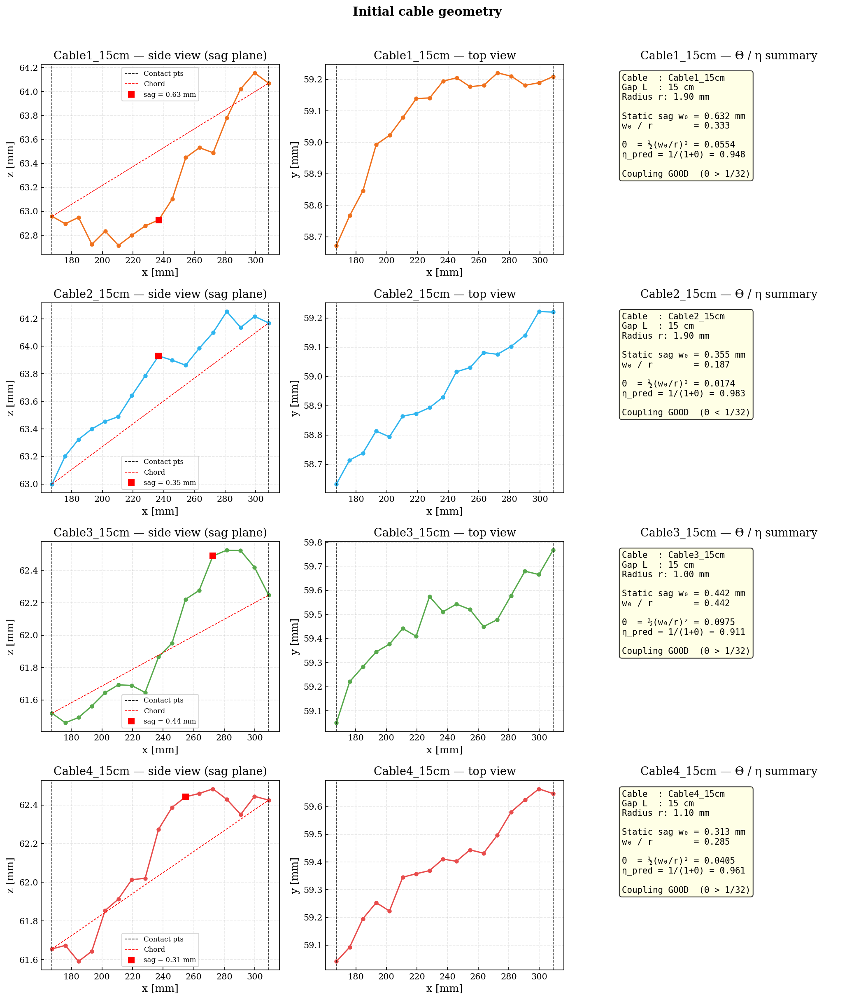


Geometry summary:
  Cable1_15cm           sag=0.632 mm  Θ=0.0554  η_pred=0.948
  Cable2_15cm           sag=0.355 mm  Θ=0.0174  η_pred=0.983
  Cable3_15cm           sag=0.442 mm  Θ=0.0975  η_pred=0.911
  Cable4_15cm           sag=0.313 mm  Θ=0.0405  η_pred=0.961


In [24]:
def measure_static_sag(XYZ, idx_left, idx_right):
    """
    Measure the maximum perpendicular deviation of the cable from the straight
    chord connecting the two contact points.

    Returns
    -------
    sag : float  Maximum perpendicular deviation [m] (always positive)
    idx_max : int  Index of the measurement point with maximum sag
    perp_distances : array  Perpendicular distance of every point from chord [m]
    """
    P1 = XYZ[idx_left]
    P2 = XYZ[idx_right]
    chord = P2 - P1
    chord_len = np.linalg.norm(chord)
    chord_unit = chord / chord_len

    perp_distances = np.zeros(len(XYZ))
    for i in range(idx_left, idx_right + 1):
        v = XYZ[i] - P1
        proj = np.dot(v, chord_unit) * chord_unit
        perp_vec = v - proj
        perp_distances[i] = np.linalg.norm(perp_vec)

    # Only look at the hanging segment
    gap_slice = slice(idx_left, idx_right + 1)
    idx_max_rel = np.argmax(perp_distances[gap_slice])
    idx_max = idx_left + idx_max_rel
    sag = perp_distances[idx_max]
    return sag, idx_max, perp_distances


# ── 3-D geometry overview ───────────────────────────────────────────────────
n_ds = len(DATASETS)
fig = plt.figure(figsize=(14, 4 * n_ds))

for row, cfg in enumerate(DATASETS):
    XYZ = cfg['XYZ']
    IL, IR = cfg['idx_left'], cfg['idx_right']
    col = PALETTE.get(cfg['color'], cfg['color'])

    # Sag measurement
    sag, idx_sag, perp_dist = measure_static_sag(XYZ, IL, IR)
    theta_pred = 0.5 * (sag / cfg['radius_m'])**2
    eta_pred   = 1.0 / (1.0 + theta_pred)
    cfg.update(dict(static_sag=sag, theta_pred=theta_pred, eta_pred=eta_pred,
                    idx_sag=idx_sag))

    # ── Side view: x vs z (sag direction) ────────────────────────────────────
    ax1 = fig.add_subplot(n_ds, 3, row * 3 + 1)
    ax1.plot(XYZ[:, 0] * 1e3, XYZ[:, 2] * 1e3, 'o-', color=col, ms=4)
    ax1.axvline(XYZ[IL, 0] * 1e3, color='k', ls='--', lw=0.8, label='Contact pts')
    ax1.axvline(XYZ[IR, 0] * 1e3, color='k', ls='--', lw=0.8)
    # Draw the chord
    ax1.plot([XYZ[IL, 0]*1e3, XYZ[IR, 0]*1e3],
             [XYZ[IL, 2]*1e3, XYZ[IR, 2]*1e3],
             'r--', lw=0.8, label='Chord')
    # Mark sag point
    ax1.plot(XYZ[idx_sag, 0]*1e3, XYZ[idx_sag, 2]*1e3,
             's', color='red', ms=7, zorder=5, label=f'sag = {sag*1e3:.2f} mm')
    ax1.set_xlabel('x [mm]'); ax1.set_ylabel('z [mm]')
    ax1.set_title(f"{cfg['label']} — side view (sag plane)")
    ax1.legend(fontsize=8)

    # ── Top view: x vs y ─────────────────────────────────────────────────────
    ax2 = fig.add_subplot(n_ds, 3, row * 3 + 2)
    ax2.plot(XYZ[:, 0] * 1e3, XYZ[:, 1] * 1e3, 'o-', color=col, ms=4)
    ax2.axvline(XYZ[IL, 0] * 1e3, color='k', ls='--', lw=0.8)
    ax2.axvline(XYZ[IR, 0] * 1e3, color='k', ls='--', lw=0.8)
    ax2.set_xlabel('x [mm]'); ax2.set_ylabel('y [mm]')
    ax2.set_title(f"{cfg['label']} — top view")

    # ── Θ summary box ─────────────────────────────────────────────────────────
    ax3 = fig.add_subplot(n_ds, 3, row * 3 + 3)
    ax3.axis('off')
    summary = (
        f"Cable  : {cfg['label']}\n"
        f"Gap L  : {cfg['gap_m']*1e2:.0f} cm\n"
        f"Radius r: {cfg['radius_m']*1e3:.2f} mm\n"
        f"\nStatic sag w₀ = {sag*1e3:.3f} mm\n"
        f"w₀ / r        = {sag/cfg['radius_m']:.3f}\n"
        f"\nΘ  = ½(w₀/r)² = {theta_pred:.4f}\n"
        f"η_pred = 1/(1+Θ) = {eta_pred:.3f}\n"
        f"\nCoupling {'GOOD' if eta_pred > 0.9 else 'MARGINAL' if eta_pred > 0.5 else 'POOR'}"
        f"  (Θ {'<' if theta_pred < 0.031 else '>'} 1/32)"
    )
    ax3.text(0.05, 0.95, summary, transform=ax3.transAxes,
             fontsize=10, va='top', family='monospace',
             bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))
    ax3.set_title(f"{cfg['label']} — Θ / η summary")

plt.suptitle("Initial cable geometry", fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

print("\nGeometry summary:")
for cfg in DATASETS:
    print(f"  {cfg['label']:20s}  sag={cfg['static_sag']*1e3:.3f} mm  "
          f"Θ={cfg['theta_pred']:.4f}  η_pred={cfg['eta_pred']:.3f}")

---
## § 4  Core Processing Functions

All signal processing lives here.  Functions are designed to work on
`(N_t, N_sensors)` arrays unless noted otherwise.

**Time-domain integration / differentiation** is done in the Fourier domain:
- More accurate than cumulative trapezoidal for long signals
- High-pass behaviour at `fmin_hp` prevents DC drift blow-up

In [25]:
# ─────────────────────────────────────────────────────────────────────────────
# 4.1  Temporal filter
# ─────────────────────────────────────────────────────────────────────────────
def bandpass(data, fs, fmin, fmax, order=4):
    """
    Zero-phase Butterworth bandpass filter along the time (axis=0) direction.

    Parameters
    ----------
    data : (N_t, ...) array
    fs   : sampling frequency [Hz]
    fmin, fmax : corner frequencies [Hz]
    order : filter order (default 4; sosfiltfilt doubles the effective order)
    """
    nyq = fs / 2.0
    sos = butter(order, [fmin / nyq, fmax / nyq], btype='band', output='sos')
    return sosfiltfilt(sos, data, axis=0)


def highpass(data, fs, fmin, order=4):
    """Zero-phase high-pass Butterworth filter (useful for removing DC before integration)."""
    nyq = fs / 2.0
    sos = butter(order, fmin / nyq, btype='high', output='sos')
    return sosfiltfilt(sos, data, axis=0)


# ─────────────────────────────────────────────────────────────────────────────
# 4.2  FFT-based integration (velocity → displacement)
# ─────────────────────────────────────────────────────────────────────────────
def integrate_fft(velocity, dt, fmin_hp=1.0):
    """
    Integrate velocity → displacement in the frequency domain.

    Division by iω is exact; a high-pass taper at fmin_hp [Hz] prevents
    DC and very-low-frequency drift from dominating the result.

    Works on (N_t,) or (N_t, N_sensors) arrays.
    """
    N   = velocity.shape[0]
    f   = np.fft.rfftfreq(N, d=dt)          # one-sided frequency axis
    # Replace near-zero frequencies with fmin_hp to avoid division by zero
    f_safe = np.where(f < fmin_hp, fmin_hp, f)

    V   = np.fft.rfft(velocity, axis=0)     # transform along time axis
    # Integration: divide by iω = i*2π*f
    iomega = 1j * 2.0 * np.pi * f_safe
    # Broadcast: reshape frequency axis so it can multiply (N_freq, N_sensors)
    if velocity.ndim == 2:
        iomega = iomega[:, np.newaxis]
    U   = V / iomega
    return np.fft.irfft(U, n=N, axis=0).astype(float)


# ─────────────────────────────────────────────────────────────────────────────
# 4.3  Amplitude spectrum helpers
# ─────────────────────────────────────────────────────────────────────────────
def amplitude_spectrum(data, fs):
    """
    Single-sided amplitude spectrum for a (N_t, ...) array.

    Returns
    -------
    freqs : (N_freq,)        [Hz]
    amp   : (N_freq, ...)    same trailing dimensions as input
    """
    N     = data.shape[0]
    spec  = np.abs(np.fft.rfft(data, axis=0)) / N
    spec[1:-1] *= 2   # correct single-sided amplitude
    freqs = np.fft.rfftfreq(N, d=1.0 / fs)
    return freqs, spec


def mean_spectrum(data, fs):
    """Mean amplitude spectrum across sensors (axis=1 of a 2-D array)."""
    freqs, spec = amplitude_spectrum(data, fs)
    return freqs, spec.mean(axis=1)


# ─────────────────────────────────────────────────────────────────────────────
# 4.4  Spatial gradient strain  (Method 1)
# ─────────────────────────────────────────────────────────────────────────────
def strain_spatial_gradient(displacement, x_coords):
    """
    Estimate inline axial strain as ∂u_x/∂x via central finite differences.

    This is the simplest method. With only ~17 points over ~15 cm the
    spatial resolution is limited (~1 cm), and noise amplification can be
    significant at short wavelengths.

    Parameters
    ----------
    displacement : (N_t, N_sensors)  x-component displacement [m]
    x_coords     : (N_sensors,)      sensor positions [m]

    Returns
    -------
    strain : (N_t, N_sensors)  [m/m]  (NaN at edges)
    """
    strain = np.full_like(displacement, np.nan)
    for i in range(1, len(x_coords) - 1):
        dx_fwd = x_coords[i + 1] - x_coords[i]
        dx_bwd = x_coords[i]     - x_coords[i - 1]
        # Non-uniform central difference
        strain[:, i] = (
            displacement[:, i + 1] * dx_bwd / (dx_fwd * (dx_fwd + dx_bwd))
            + displacement[:, i]   * (dx_fwd - dx_bwd) / (dx_fwd * dx_bwd)
            - displacement[:, i - 1] * dx_fwd / (dx_bwd * (dx_fwd + dx_bwd))
        )
    return strain


# ─────────────────────────────────────────────────────────────────────────────
# 4.5  3-D arc-length strain  (Method 2 — linearised)
# ─────────────────────────────────────────────────────────────────────────────
def strain_3d_arclength(XYZ, disp_x, disp_y, disp_z, idx_left, idx_right):
    """
    Compute the total axial elongation δx_l of the hanging cable segment
    using the 3-D linearised arc-length formula (Approach 1, Probst methods doc).

    For each consecutive pair of measurement points i, i+1 inside the gap
    [idx_left, idx_right], the change in segment length is

        δd_i(t) ≈ ê_i · (u_{i+1}(t) − u_i(t))

    where ê_i is the unit vector along segment i in the reference configuration.
    The total arc-length change is the sum over all segments.

    The linearisation is valid when |u| ≪ segment length (should hold here).

    Parameters
    ----------
    XYZ   : (N_s, 3)          reference 3-D coordinates [m]
    disp_x/y/z : (N_t, N_s)   displacement components [m]
    idx_left, idx_right : int  contact point indices

    Returns
    -------
    delta_xl : (N_t,)  total axial elongation of the gap segment [m]
    """
    delta_xl = np.zeros(disp_x.shape[0])

    for i in range(idx_left, idx_right):
        # Reference unit vector for segment i → i+1
        seg_vec = XYZ[i + 1] - XYZ[i]
        seg_len = np.linalg.norm(seg_vec)
        e_hat   = seg_vec / seg_len           # (3,)

        # Relative displacement of endpoints of this segment
        du = np.stack([
            disp_x[:, i + 1] - disp_x[:, i],
            disp_y[:, i + 1] - disp_y[:, i],
            disp_z[:, i + 1] - disp_z[:, i],
        ], axis=1)                             # (N_t, 3)

        # Project onto the reference direction
        delta_xl += du @ e_hat                 # dot product → (N_t,)

    return delta_xl


# ─────────────────────────────────────────────────────────────────────────────
# 4.6  Mode-shape projection  (Method 3)
# ─────────────────────────────────────────────────────────────────────────────
def _phi(s, xf):
    """
    First symmetric flexural mode shape.
    s is the normalised arc-length in [0, 1]; xf is the midpoint amplitude.
    φ(s) = xf * (1 - cos(2π s)) / 2
    """
    return xf * (1.0 - np.cos(2.0 * np.pi * s)) / 2.0


def fit_mode_shape(XYZ, idx_left, idx_right, disp_z_t=None):
    """
    Fit the first symmetric bending mode to the cable's transverse (z) profile.

    If disp_z_t is None, fits to the static (reference) z-coordinates.
    If disp_z_t is (N_t, N_s), fits to each time step and returns
    the amplitude time series xf(t).

    Parameters
    ----------
    XYZ        : (N_s, 3)   reference positions
    idx_left/right : int    contact point indices
    disp_z_t   : optional (N_t, N_s)   z-displacement [m]

    Returns
    -------
    xf0   : float   static midpoint sag from fit [m]
    xf_t  : (N_t,)  time-varying amplitude (only if disp_z_t is given)
    s_coords : (N_gap,) normalised arc-length coordinates
    """
    # Extract the hanging segment
    idx_gap = slice(idx_left, idx_right + 1)
    xyz_gap = XYZ[idx_gap]                    # (N_gap, 3)

    # Normalised arc-length along the chord
    chord_start = xyz_gap[0]
    chord_vec   = xyz_gap[-1] - xyz_gap[0]
    L_chord     = np.linalg.norm(chord_vec)
    chord_unit  = chord_vec / L_chord
    # Project each point onto the chord to get s ∈ [0, 1]
    s_coords = np.array([
        np.dot(xyz_gap[k] - chord_start, chord_unit) / L_chord
        for k in range(len(xyz_gap))
    ])

    # Reference z-profile (deflection relative to chord)
    z_chord = np.array([chord_start[2] + s * chord_vec[2] for s in s_coords])
    z_sag   = xyz_gap[:, 2] - z_chord   # deviation below the chord

    # Fit mode shape to static profile
    try:
        popt, _ = curve_fit(_phi, s_coords, z_sag, p0=[z_sag.max() + 1e-10])
        xf0 = float(popt[0])
    except RuntimeError:
        xf0 = float(z_sag.max())
        print("  Warning: mode-shape fit did not converge; using max sag.")

    if disp_z_t is None:
        return xf0, None, s_coords

    # Fit to each time step
    dz_gap = disp_z_t[:, idx_left:idx_right + 1]   # (N_t, N_gap)
    xf_t   = np.zeros(disp_z_t.shape[0])
    for ti in range(len(xf_t)):
        z_now = z_sag + dz_gap[ti]   # total z-profile at time ti
        try:
            popt, _ = curve_fit(_phi, s_coords, z_now, p0=[xf0])
            xf_t[ti] = float(popt[0])
        except RuntimeError:
            xf_t[ti] = np.nan

    return xf0, xf_t, s_coords


def strain_mode_projection(delta_L, xf0, delta_xf, gap_L):
    """
    Compute cable axial elongation via mode-shape projection (Approach 2, methods doc).

    δx_l = δL + C₁ · xf₀ · δxf
    where C₁ = π²/(2L)  for the first symmetric mode.

    Note on sign convention: when endpoints move CLOSER together (δL < 0),
    the sag INCREASES (δxf > 0). The two terms partially cancel, so δx_l < δL,
    meaning less axial compression is transferred — consistent with bending stress relief.

    Parameters
    ----------
    delta_L   : (N_t,)  endpoint displacement (from shaker) [m]
    xf0       : float   static midpoint sag amplitude [m]
    delta_xf  : (N_t,)  change in midpoint sag [m]  (= xf(t) − xf0)
    gap_L     : float   gap length [m]

    Returns
    -------
    delta_xl : (N_t,)  cable axial elongation [m]
    """
    C1 = np.pi**2 / (2.0 * gap_L)   # geometric constant of mode shape
    delta_xl = delta_L + C1 * xf0 * delta_xf
    return delta_xl


print("Processing functions defined.")

Processing functions defined.


---
## § 5  Spectral Overview & Shaker Normalisation

A log-sweep gives approximately **equal power per octave**, so looking at the raw amplitude
spectrum of the cable velocity and dividing by the shaker spectrum removes the
frequency-dependent shaker response. The result is the **transfer function** of the
cable-to-shaker coupling and is our first estimate of η(f).

We also check whether the shaker output deviates from a flat spectrum — if the cable's
stiffness is loading the shaker, you will see dips in the shaker spectrum near resonances.

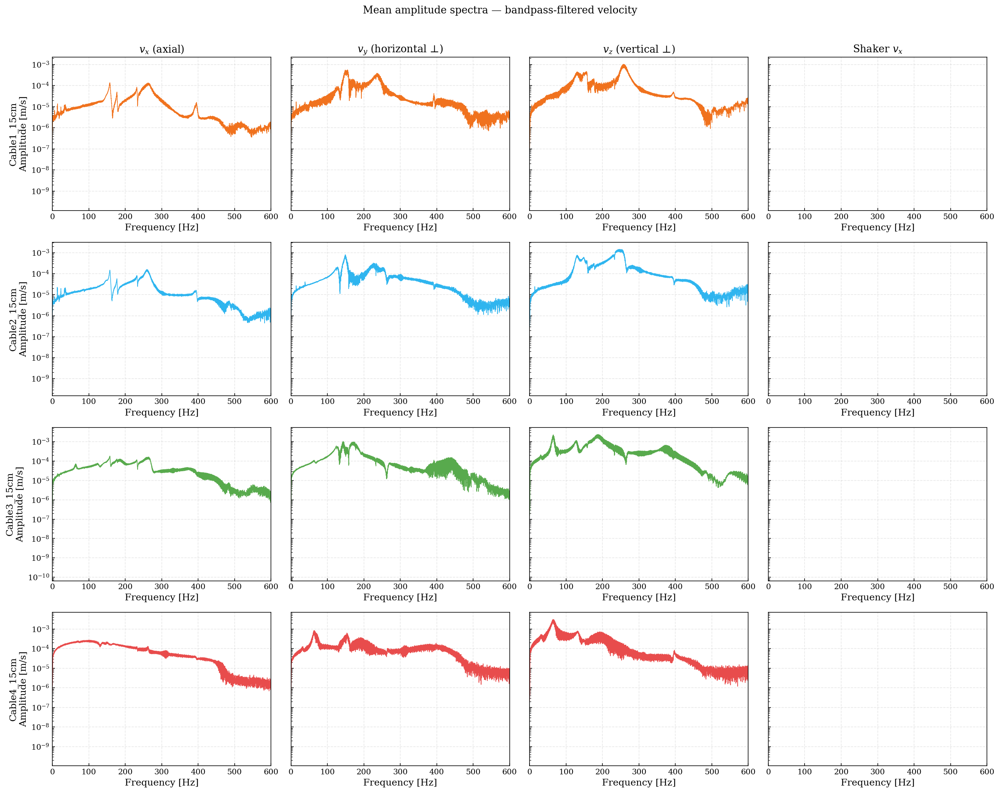

In [26]:
# ── Compute and cache spectra for all datasets ───────────────────────────────
for cfg in DATASETS:
    fs = cfg['fs']
    # Cable: bandpass-filtered velocity spectra (mean over sensors)
    vx_f = bandpass(cfg['vx'], fs, BP_FMIN, BP_FMAX)
    vy_f = bandpass(cfg['vy'], fs, BP_FMIN, BP_FMAX)
    vz_f = bandpass(cfg['vz'], fs, BP_FMIN, BP_FMAX)

    freqs, ampx = mean_spectrum(vx_f, fs)
    _,     ampy = mean_spectrum(vy_f, fs)
    _,     ampz = mean_spectrum(vz_f, fs)

    # Shaker: single-channel spectrum
    sh_f    = bandpass(cfg['shaker_v'][:, np.newaxis], fs, BP_FMIN, BP_FMAX)[:, 0]
    _, amp_sh = mean_spectrum(sh_f[:, np.newaxis], fs)
    amp_sh   = amp_sh.ravel()

    cfg.update(dict(
        vx_f=vx_f, vy_f=vy_f, vz_f=vz_f, sh_f=sh_f,
        freqs=freqs, ampx=ampx, ampy=ampy, ampz=ampz, amp_sh=amp_sh,
    ))

# ── Figure: amplitude spectra per component & shaker ─────────────────────────
n_ds  = len(DATASETS)
fig, axes = plt.subplots(n_ds, 4, figsize=(18, 3.5 * n_ds), sharey='row')
if n_ds == 1:
    axes = axes[np.newaxis, :]

comp_labels = ['$v_x$ (axial)', '$v_y$ (horizontal ⊥)', '$v_z$ (vertical ⊥)', 'Shaker $v_x$']

for row, cfg in enumerate(DATASETS):
    col = PALETTE.get(cfg['color'], cfg['color'])
    for ci, (amp, lbl) in enumerate(zip(
        [cfg['ampx'], cfg['ampy'], cfg['ampz'], cfg['amp_sh']],
        comp_labels
    )):
        ax = axes[row, ci]
        ax.semilogy(cfg['freqs'], amp, color=(col if ci < 3 else 'k'), lw=0.8)
        ax.set_xlim(0, BP_FMAX)
        if row == 0:
            ax.set_title(lbl)
        if ci == 0:
            ax.set_ylabel(f"{cfg['label']}\nAmplitude [m/s]")
        ax.set_xlabel('Frequency [Hz]')

plt.suptitle('Mean amplitude spectra — bandpass-filtered velocity', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

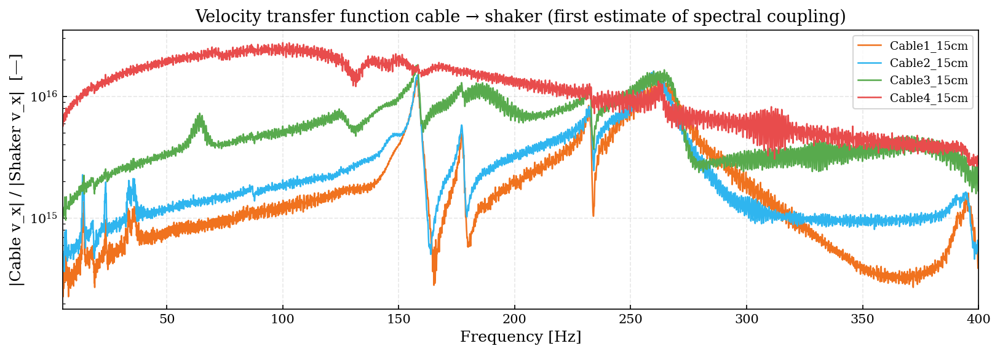

In [27]:
# ── Transfer function: cable vx / shaker vx ──────────────────────────────────
#
# This is a raw velocity ratio, NOT yet the strain-transfer efficiency η.
# It shows how efficiently the shaker's axial motion is picked up by each
# cable sensor, integrated across the cable.
# Peaks indicate resonances; dips indicate bending stress relief.
#
# NOTE: because DAS measures strain and the seismometer measures velocity,
# the units of this ratio are dimensionless but the absolute value depends
# on the gauge length interpretation. Use relative comparisons between cables.

fig, ax = plt.subplots(figsize=(11, 4))

for cfg in DATASETS:
    col  = PALETTE.get(cfg['color'], cfg['color'])
    eps  = 1e-20   # small floor to avoid log(0)
    # Smooth denominator slightly to avoid spiky division
    sh_smooth = np.maximum(cfg['amp_sh'], eps)
    tf = cfg['ampx'] / sh_smooth
    cfg['transfer_fn'] = tf          # cache for later use

    mask = (cfg['freqs'] >= ETA_FMIN) & (cfg['freqs'] <= ETA_FMAX)
    ax.semilogy(cfg['freqs'][mask], tf[mask], color=col, lw=1.2, label=cfg['label'])

ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel('|Cable v_x| / |Shaker v_x|  [—]')
ax.set_title('Velocity transfer function cable → shaker (first estimate of spectral coupling)')
ax.legend(fontsize=9)
ax.set_xlim(ETA_FMIN, ETA_FMAX)
plt.tight_layout()
plt.show()

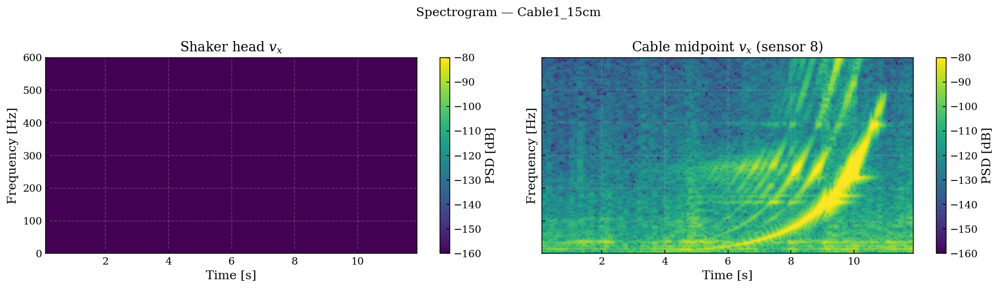

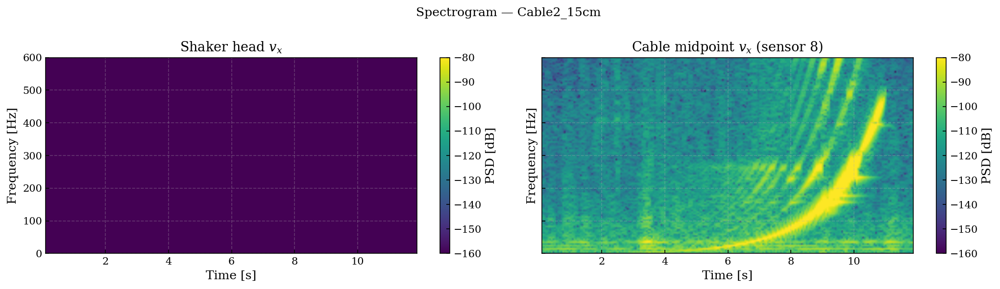

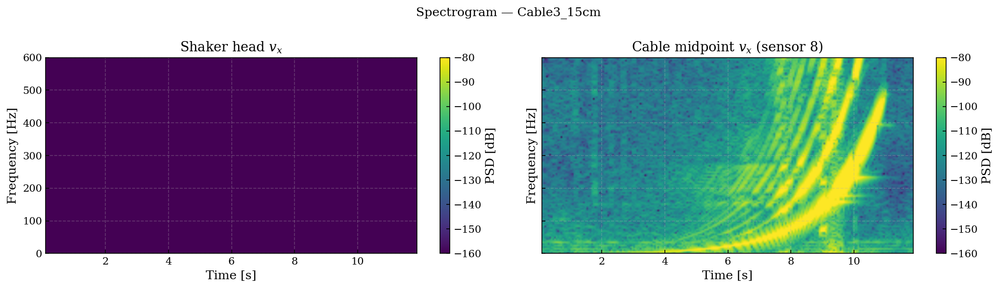

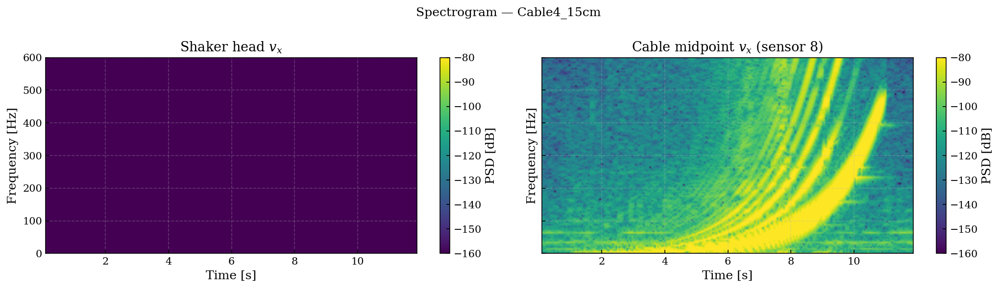

In [28]:
# ── Spectrogram of shaker & cable midpoint ───────────────────────────────────
#
# Very useful for the sweep: should see a diagonal ridge following f(t).
# Resonances show as horizontal 'flares' where the energy is elevated
# regardless of the instantaneous sweep frequency.
#
# We use the midpoint sensor (roughly mid-gap) for the cable.

for cfg in DATASETS:
    fs  = cfg['fs']
    mid = (cfg['idx_left'] + cfg['idx_right']) // 2   # mid-gap sensor

    fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=True)

    for ax, sig, title in zip(
        axes,
        [cfg['shaker_v'], cfg['vx'][:, mid]],
        ['Shaker head $v_x$', f'Cable midpoint $v_x$ (sensor {mid})']
    ):
        f_sg, t_sg, Sxx = spectrogram(sig, fs=fs, nperseg=1024, noverlap=768)
        pcm = ax.pcolormesh(t_sg, f_sg, 10 * np.log10(Sxx + 1e-30),
                            shading='gouraud', cmap='viridis',
                            vmin=-160, vmax=-80)
        ax.set_ylim(0, BP_FMAX)
        ax.set_xlabel('Time [s]')
        ax.set_ylabel('Frequency [Hz]')
        ax.set_title(title)
        plt.colorbar(pcm, ax=ax, label='PSD [dB]')

    plt.suptitle(f'Spectrogram — {cfg["label"]}', fontsize=12)
    plt.tight_layout()
    plt.show()

---
## § 6  Velocity Wavefields & Sweep Zoom Windows

A space–time plot shows how the wavefield evolves along the cable.
For a sweep signal, zooming into short time windows around the moment when the
sweep passes through a given frequency lets you observe the cable behaviour
at that frequency as if it were a quasi-monochromatic excitation.

In [29]:
def plot_spacetime(x, t, components_dict, clim=None, t_min=None, t_max=None,
                   suptitle='', unit='[m/s]'):
    """
    Plot one space–time panel per component.

    Parameters
    ----------
    x              : (N_s,) sensor positions [m]
    t              : (N_t,) time vector [s]
    components_dict: dict of label → (N_t, N_s) array
    clim           : colour scale limit (symmetric ± clim).  Auto if None.
    t_min/t_max    : time axis limits for zooming
    """
    n_comp = len(components_dict)
    fig, axes = plt.subplots(1, n_comp, figsize=(5 * n_comp, 5), sharey=True)
    if n_comp == 1:
        axes = [axes]

    t_mask = slice(None)
    t_plot = t
    if t_min is not None and t_max is not None:
        t_mask = (t >= t_min) & (t <= t_max)
        t_plot = t[t_mask]

    for ax, (lbl, data) in zip(axes, components_dict.items()):
        d_plot = data[t_mask]
        vmax = clim if clim is not None else np.abs(d_plot).max() * 0.95
        pcm = ax.pcolormesh(x * 1e3, t_plot, d_plot,
                            cmap='RdBu_r', vmin=-vmax, vmax=vmax,
                            shading='nearest')
        plt.colorbar(pcm, ax=ax, label=unit, shrink=0.8)
        ax.set_xlabel('Position [mm]')
        ax.set_ylabel('Time [s]')
        ax.set_title(lbl)

    plt.suptitle(suptitle, fontsize=12, y=1.01)
    plt.tight_layout()
    plt.show()

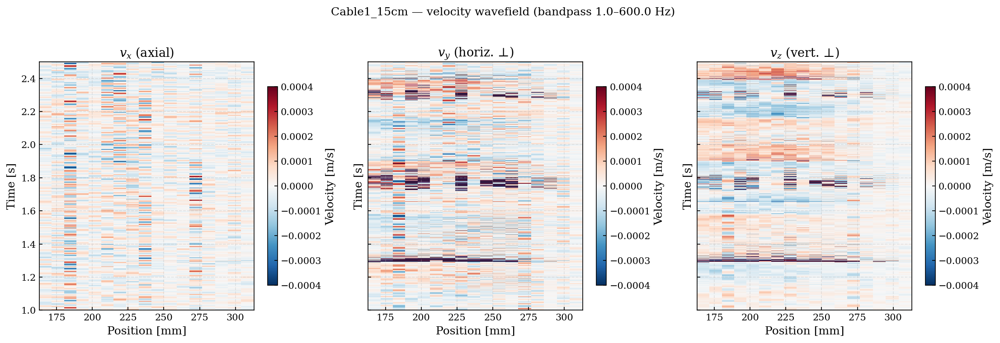

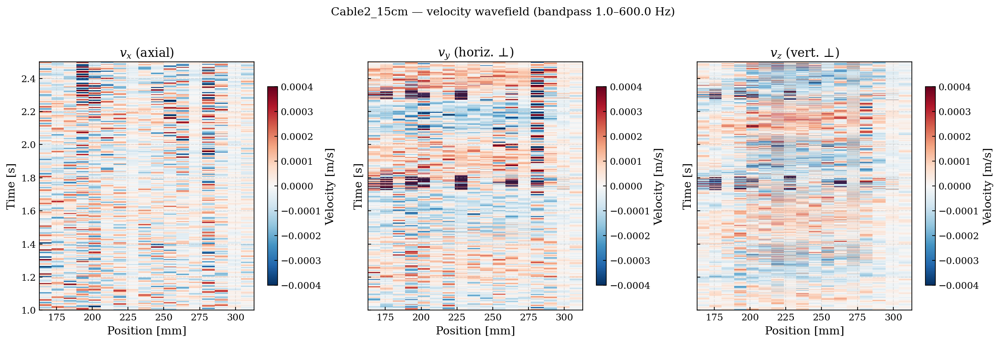

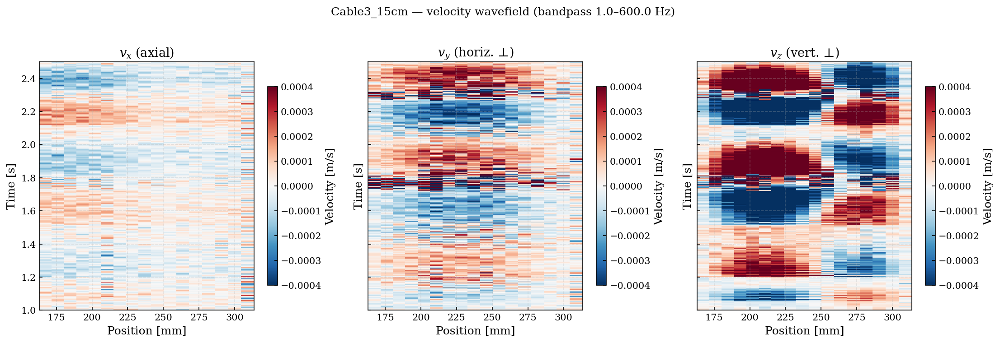

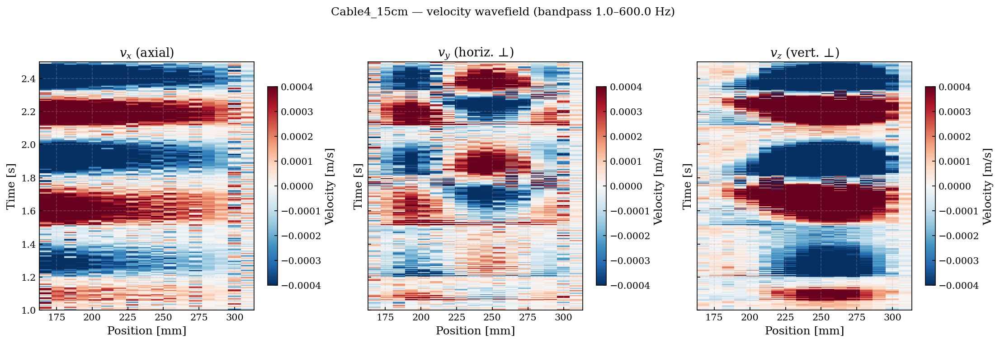

In [30]:
# ── Full space–time wavefields ───────────────────────────────────────────────
for cfg in DATASETS:
    plot_spacetime(
        cfg['x'], cfg['t'],
        {'$v_x$ (axial)': cfg['vx_f'],
         '$v_y$ (horiz. ⊥)': cfg['vy_f'],
         '$v_z$ (vert. ⊥)': cfg['vz_f']},
         clim= 0.0004,
        t_min=1, t_max=2.5, 
        suptitle=f"{cfg['label']} — velocity wavefield (bandpass {BP_FMIN}–{BP_FMAX} Hz)",
        unit='Velocity [m/s]',
    )

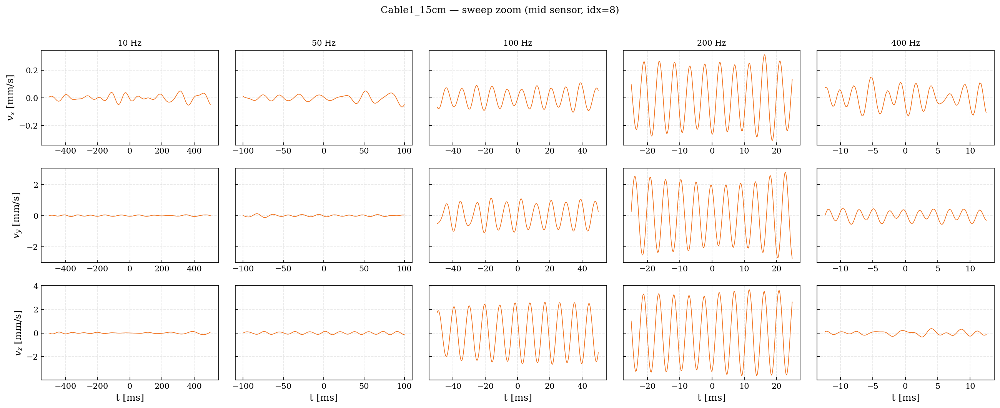

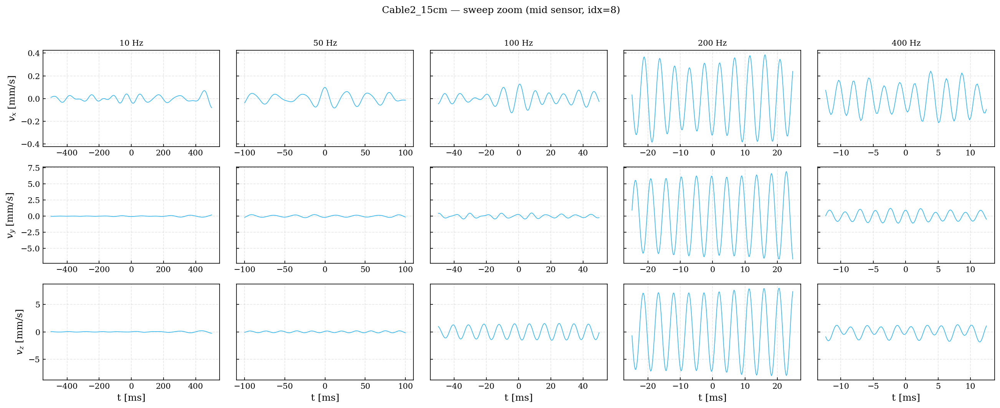

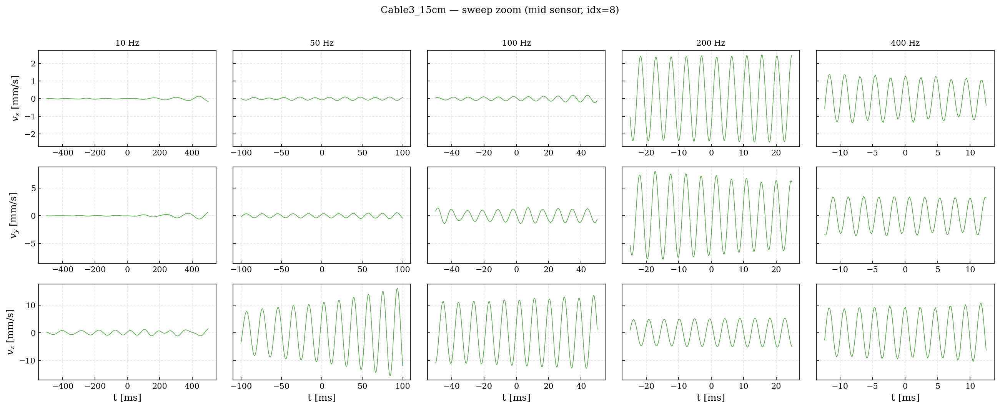

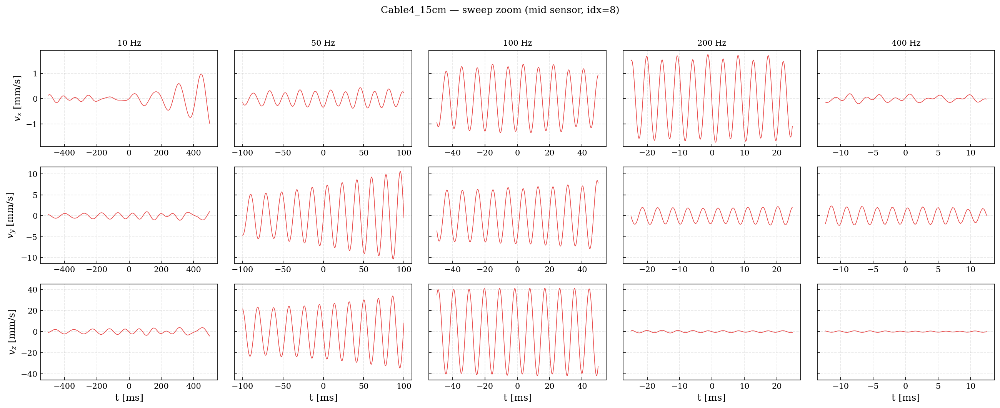

In [31]:
# ── Sweep zoom: plot one short window per zoom frequency ────────────────────
#
# Each panel is bandpass-filtered around the zoom frequency ± 30 % so you
# see near-monochromatic oscillations.  This makes the phase and amplitude
# behaviour at each frequency directly readable.
#
# Rows: datasets (cables / gap lengths)
# Columns: zoom frequencies

for cfg in DATASETS:
    fs = cfg['fs']
    n_zoom = len(ZOOM_WINDOWS)

    # Choose a representative sensor near the midpoint
    mid = (cfg['idx_left'] + cfg['idx_right']) // 2

    # Compare 3 components at mid sensor
    fig, axes = plt.subplots(3, n_zoom, figsize=(3.5 * n_zoom, 7), sharey='row')

    comp_data  = [cfg['vx'][:, mid], cfg['vy'][:, mid], cfg['vz'][:, mid]]
    comp_names = ['$v_x$', '$v_y$', '$v_z$']

    for ci, (cdata, cname) in enumerate(zip(comp_data, comp_names)):
        for zi, (t_start, t_end, f_label) in enumerate(ZOOM_WINDOWS):
            ax = axes[ci, zi]
            # Bandpass tightly around the zoom frequency
            f_c   = float(f_label.replace(' Hz', ''))
            f_lo  = max(BP_FMIN, f_c * 0.7)
            f_hi  = min(BP_FMAX, f_c * 1.3)
            try:
                sig_bp = bandpass(cdata[:, np.newaxis], fs, f_lo, f_hi)[:, 0]
            except Exception:
                sig_bp = cdata
            mask   = (cfg['t'] >= t_start) & (cfg['t'] <= t_end)
            t_zoom = cfg['t'][mask] - (t_start + t_end) / 2.0   # centre at 0

            ax.plot(t_zoom * 1e3, sig_bp[mask] * 1e3, lw=0.8,
                    color=PALETTE.get(cfg['color'], cfg['color']))

            if ci == 0:
                ax.set_title(f_label, fontsize=10)
            if zi == 0:
                ax.set_ylabel(f'{cname} [mm/s]')
            if ci == 2:
                ax.set_xlabel('t [ms]')

    plt.suptitle(f"{cfg['label']} — sweep zoom (mid sensor, idx={mid})",
                 fontsize=12, y=1.01)
    plt.tight_layout()
    plt.show()

---
## § 7  Displacement Conversion (FFT-based)

Velocity is integrated to displacement in the Fourier domain.  
The shaker velocity is also integrated to give **δL(t)**, the
time-varying endpoint displacement (the reference strain numerator denominator).

Cable1_15cm           peak δL = 0.0 nm  peak ux = 36731.5 nm
Cable2_15cm           peak δL = 0.0 nm  peak ux = 26386.8 nm
Cable3_15cm           peak δL = 0.0 nm  peak ux = 47820.4 nm
Cable4_15cm           peak δL = 0.0 nm  peak ux = 89839.1 nm


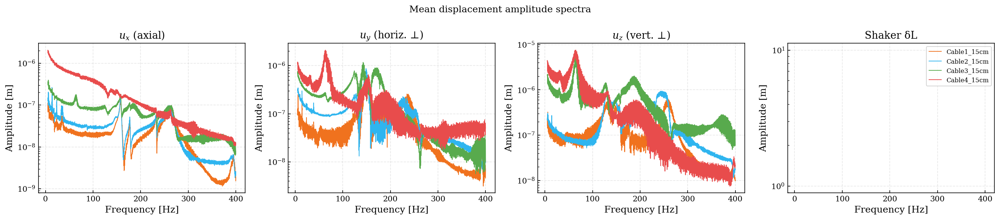

In [32]:
for cfg in DATASETS:
    fs = cfg['fs']; dt = cfg['dt']

    # Integrate all three components (use bandpass-filtered velocities)
    ux = integrate_fft(cfg['vx_f'], dt, fmin_hp=INT_FMIN_HP)
    uy = integrate_fft(cfg['vy_f'], dt, fmin_hp=INT_FMIN_HP)
    uz = integrate_fft(cfg['vz_f'], dt, fmin_hp=INT_FMIN_HP)

    # Shaker displacement = δL(t): the total endpoint motion [m]
    delta_L = integrate_fft(cfg['sh_f'][:, np.newaxis], dt, fmin_hp=INT_FMIN_HP)[:, 0]

    cfg.update(dict(ux=ux, uy=uy, uz=uz, delta_L=delta_L))

    # Displacement spectra
    freqs, amp_ux = mean_spectrum(ux, fs)
    _,     amp_uy = mean_spectrum(uy, fs)
    _,     amp_uz = mean_spectrum(uz, fs)
    _, amp_dL     = mean_spectrum(delta_L[:, np.newaxis], fs)
    cfg.update(dict(amp_ux=amp_ux, amp_uy=amp_uy, amp_uz=amp_uz, amp_dL=amp_dL.ravel()))

    print(f"{cfg['label']:20s}  peak δL = {np.abs(delta_L).max()*1e9:.1f} nm  "
          f"peak ux = {np.abs(ux).max()*1e9:.1f} nm")

# ── Plot displacement spectra ─────────────────────────────────────────────────
fig, axes = plt.subplots(1, 4, figsize=(18, 4))
for cfg in DATASETS:
    col = PALETTE.get(cfg['color'], cfg['color'])
    f   = cfg['freqs']
    for ax, amp, lbl in zip(axes,
        [cfg['amp_ux'], cfg['amp_uy'], cfg['amp_uz'], cfg['amp_dL']],
        ['$u_x$ (axial)', '$u_y$ (horiz. ⊥)', '$u_z$ (vert. ⊥)', 'Shaker δL']):
        mask = (f >= ETA_FMIN) & (f <= ETA_FMAX)
        ax.semilogy(f[mask], amp[mask], color=col, lw=0.9, label=cfg['label'])
        ax.set_xlabel('Frequency [Hz]')
        ax.set_ylabel('Amplitude [m]')
        ax.set_title(lbl)

axes[-1].legend(fontsize=8)
plt.suptitle('Mean displacement amplitude spectra', fontsize=12)
plt.tight_layout()
plt.show()

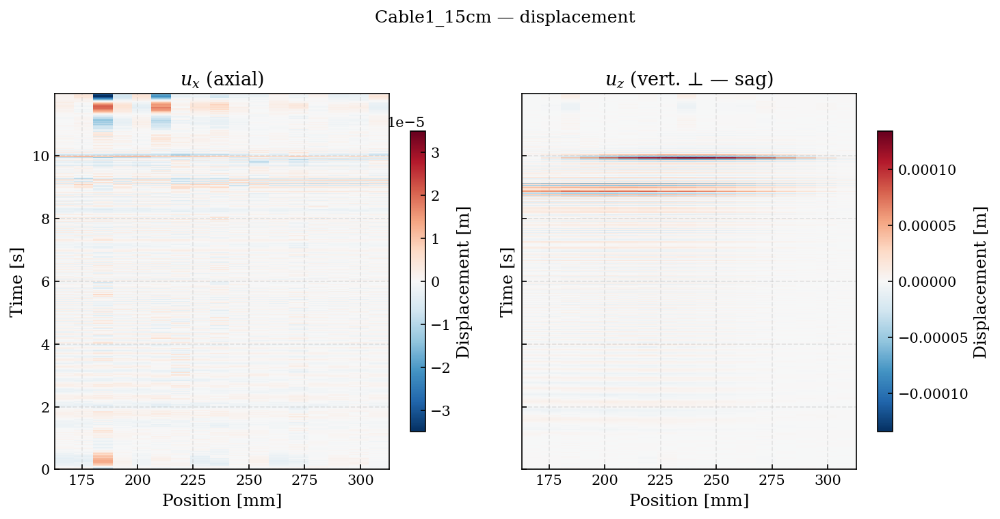

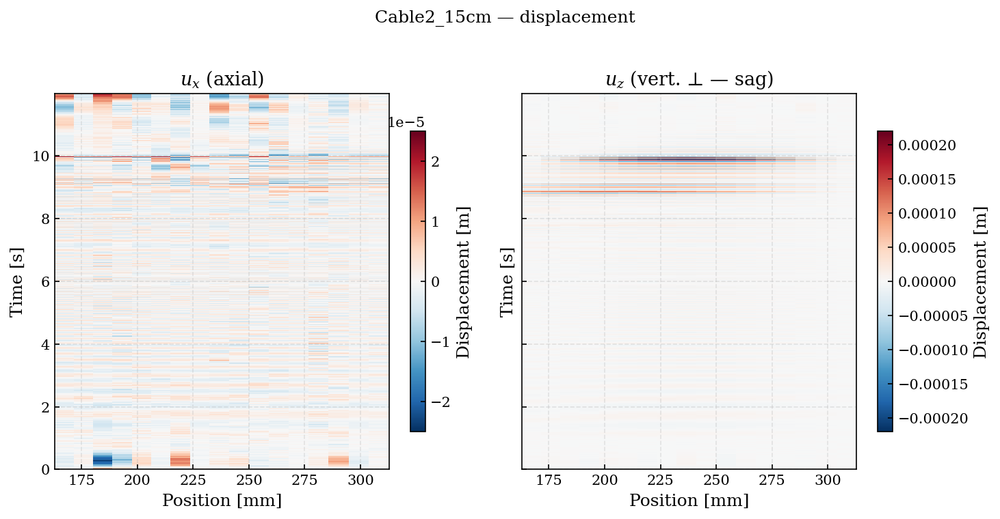

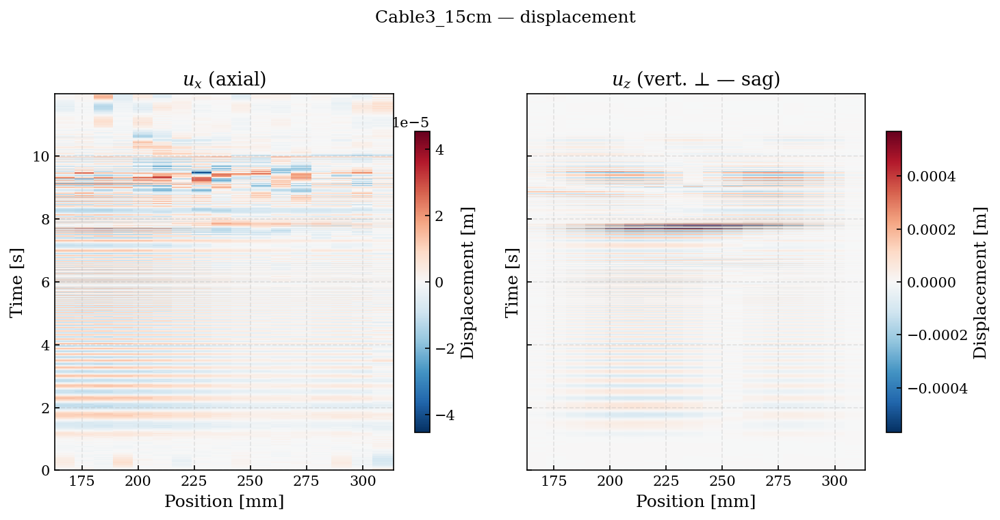

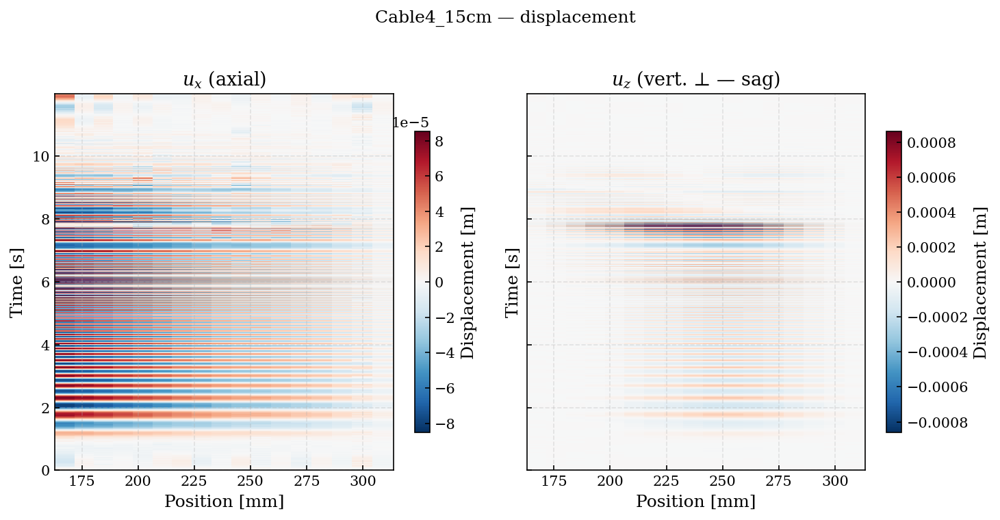

In [33]:
# ── Displacement wavefields ───────────────────────────────────────────────────
for cfg in DATASETS:
    plot_spacetime(
        cfg['x'], cfg['t'],
        {'$u_x$ (axial)': cfg['ux'],
         '$u_z$ (vert. ⊥ — sag)': cfg['uz']},
        suptitle=f"{cfg['label']} — displacement",
        unit='Displacement [m]',
    )

---
## § 8  Strain — Three Methods

### Method 1: Spatial gradient (finite differences)
Classic approach. Works everywhere on the array but is sensitive to spatial noise.
With only 17 points the resolution is ~1 cm; useful for a qualitative check.

### Method 2: 3-D arc-length (linearised)
Sums the projected displacement differences over all segments **inside the gap only**.  
Uses the full 3-D position data so it is insensitive to the choice of 'axial' direction.
This is the primary recommended method.

### Method 3: Mode-shape projection
Fits the first symmetric bending mode φ(s) to the transverse (z) deflection at every
time step. The amplitude xf(t) is then used with the geometric constraint to infer δx_l.  
Valid **only** if the cable actually deforms in that mode — check the animations first!

Cable1_15cm           peak |ε_x| (grad) = 2.425e-03
Cable2_15cm           peak |ε_x| (grad) = 1.702e-03
Cable3_15cm           peak |ε_x| (grad) = 2.990e-03
Cable4_15cm           peak |ε_x| (grad) = 2.138e-03


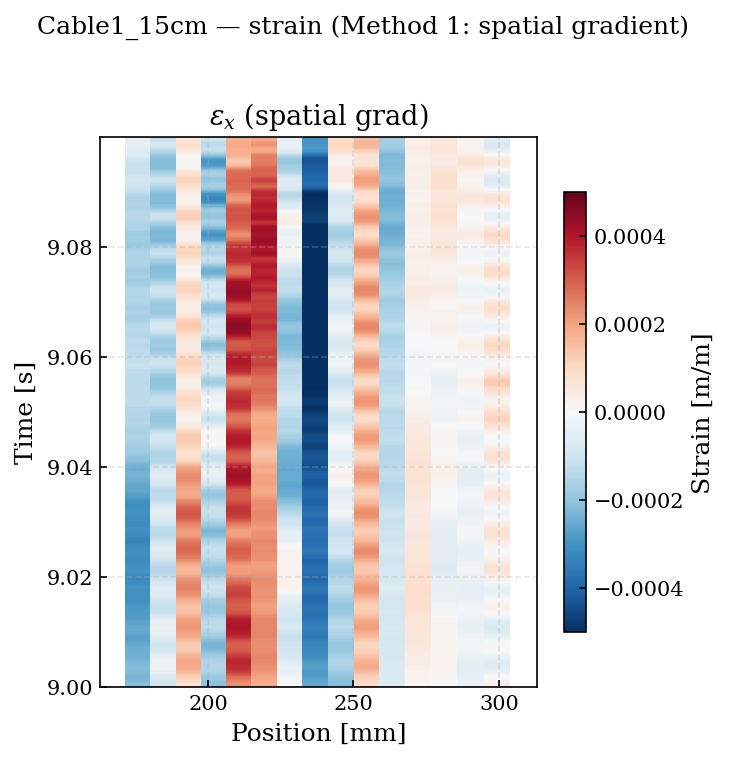

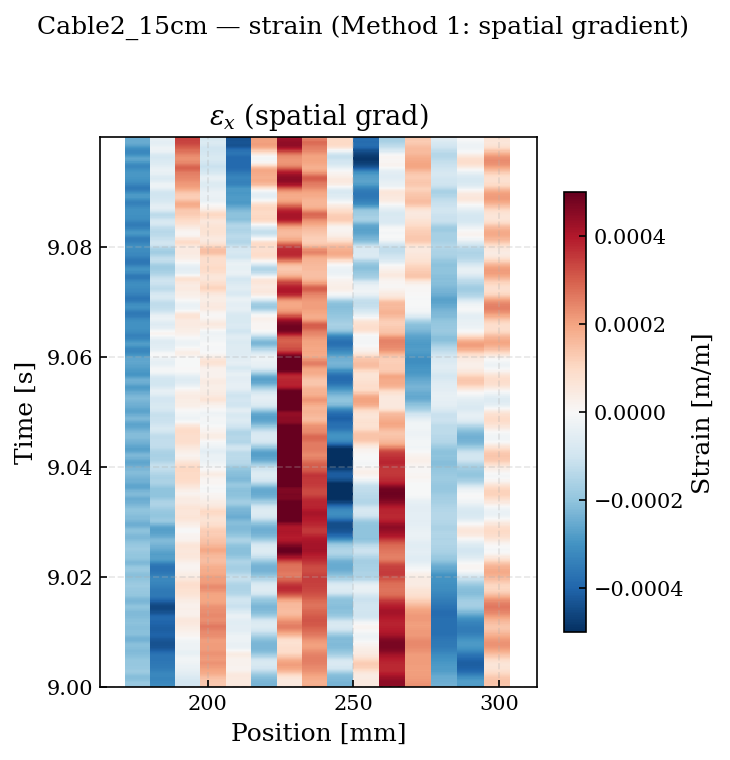

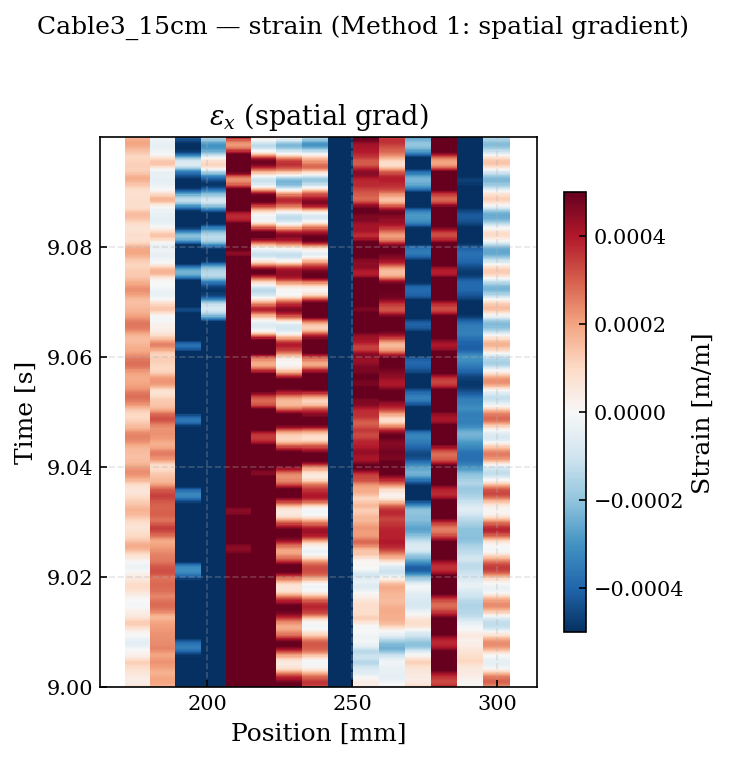

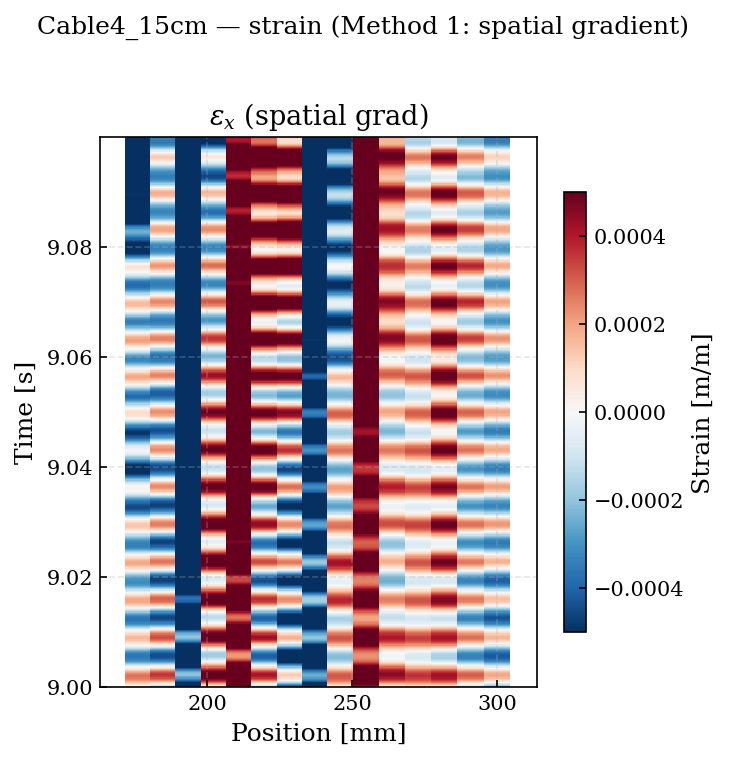

In [45]:
# ── Method 1: Spatial gradient ───────────────────────────────────────────────
for cfg in DATASETS:
    eps_x = strain_spatial_gradient(cfg['ux'], cfg['x'])
    cfg['strain_grad'] = eps_x
    print(f"{cfg['label']:20s}  peak |ε_x| (grad) = {np.nanmax(np.abs(eps_x)):.3e}")

# Space–time plot of strain from gradient method
for cfg in DATASETS:
    plot_spacetime(
        cfg['x'], cfg['t'],
        {'$\\varepsilon_x$ (spatial grad)': cfg['strain_grad']},
        t_min=9, t_max=9.1,
        clim= 0.0005,
        suptitle=f"{cfg['label']} — strain (Method 1: spatial gradient)",
        unit='Strain [m/m]',
    )

Cable1_15cm           peak |δx_l| (arc) = 3324.4 nm
Cable2_15cm           peak |δx_l| (arc) = 7528.0 nm
Cable3_15cm           peak |δx_l| (arc) = 12149.2 nm
Cable4_15cm           peak |δx_l| (arc) = 76719.1 nm


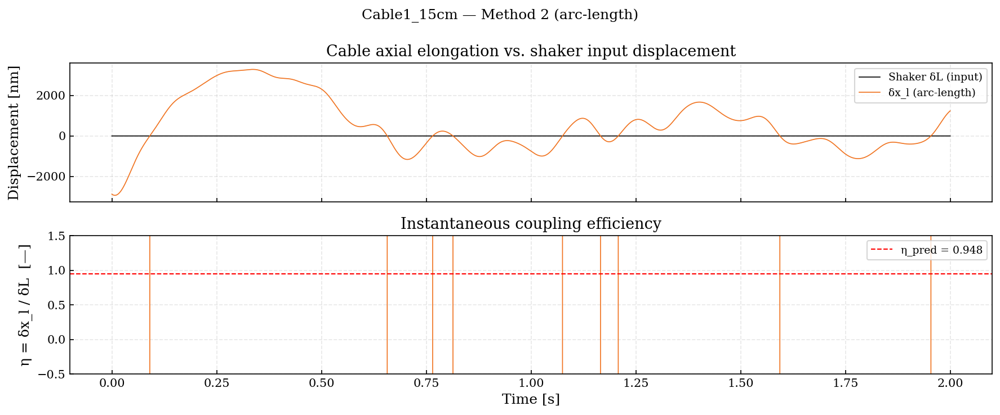

: 

In [ ]:
# ── Method 2: 3-D arc-length ─────────────────────────────────────────────────
for cfg in DATASETS:
    IL, IR = cfg['idx_left'], cfg['idx_right']
    delta_xl_arclength = strain_3d_arclength(
        cfg['XYZ'], cfg['ux'], cfg['uy'], cfg['uz'], IL, IR
    )
    cfg['delta_xl_arclength'] = delta_xl_arclength
    print(f"{cfg['label']:20s}  peak |δx_l| (arc) = {np.abs(delta_xl_arclength).max()*1e9:.1f} nm")

# Time-domain comparison of δx_l vs δL for one dataset (first)
cfg = DATASETS[0]
fig, axes = plt.subplots(2, 1, figsize=(12, 5), sharex=True)

# Limit to the first 2 seconds for readability
tmask = cfg['t'] <= 2.0

axes[0].plot(cfg['t'][tmask], cfg['delta_L'][tmask] * 1e9,
             'k', lw=0.8, label='Shaker δL (input)')
axes[0].plot(cfg['t'][tmask], cfg['delta_xl_arclength'][tmask] * 1e9,
             color=PALETTE.get(cfg['color'], 'C0'), lw=0.8, label='δx_l (arc-length)')
axes[0].set_ylabel('Displacement [nm]')
axes[0].legend(fontsize=9)
axes[0].set_title('Cable axial elongation vs. shaker input displacement')

axes[1].plot(cfg['t'][tmask],
             cfg['delta_xl_arclength'][tmask] / (cfg['delta_L'][tmask] + 1e-30),
             color=PALETTE.get(cfg['color'], 'C0'), lw=0.8)
axes[1].axhline(cfg['eta_pred'], color='r', ls='--', lw=1.0,
                label=f"η_pred = {cfg['eta_pred']:.3f}")
axes[1].set_ylim(-0.5, 1.5)
axes[1].set_ylabel('η = δx_l / δL  [—]')
axes[1].set_xlabel('Time [s]')
axes[1].legend(fontsize=9)
axes[1].set_title('Instantaneous coupling efficiency')

plt.suptitle(f'{cfg["label"]} — Method 2 (arc-length)', fontsize=12)
plt.tight_layout()
plt.show()

Cable1_15cm           xf0 (fit) = -0.539 mm  (static sag = 0.632 mm)
Cable2_15cm           xf0 (fit) = 0.300 mm  (static sag = 0.355 mm)
Cable3_15cm           xf0 (fit) = 0.082 mm  (static sag = 0.442 mm)
Cable4_15cm           xf0 (fit) = 0.207 mm  (static sag = 0.313 mm)


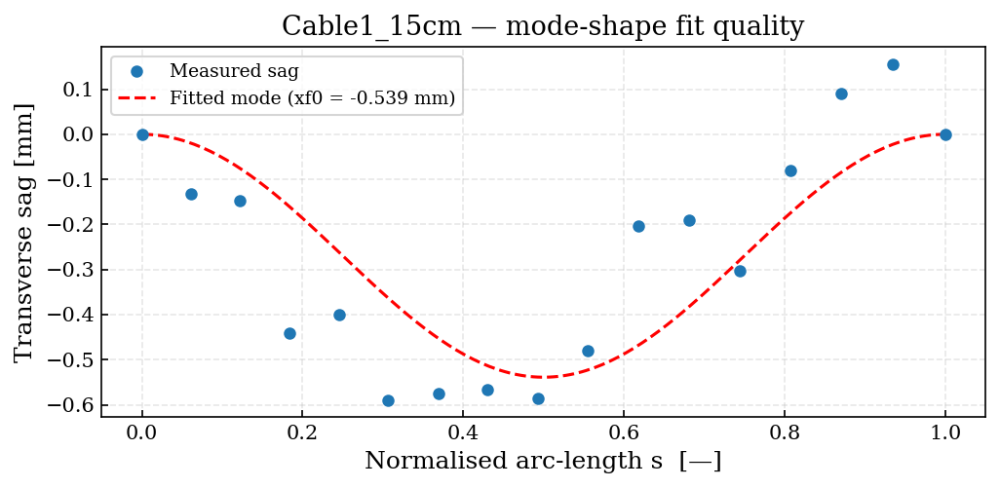

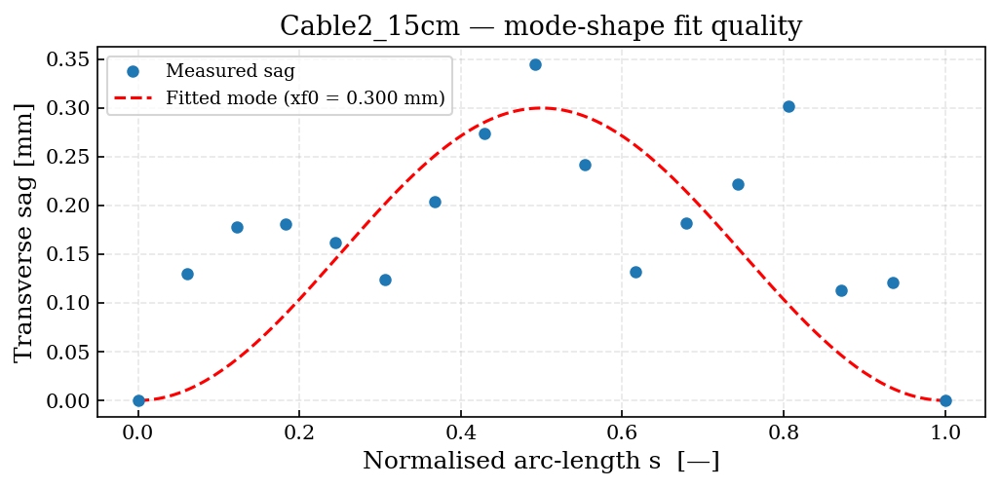

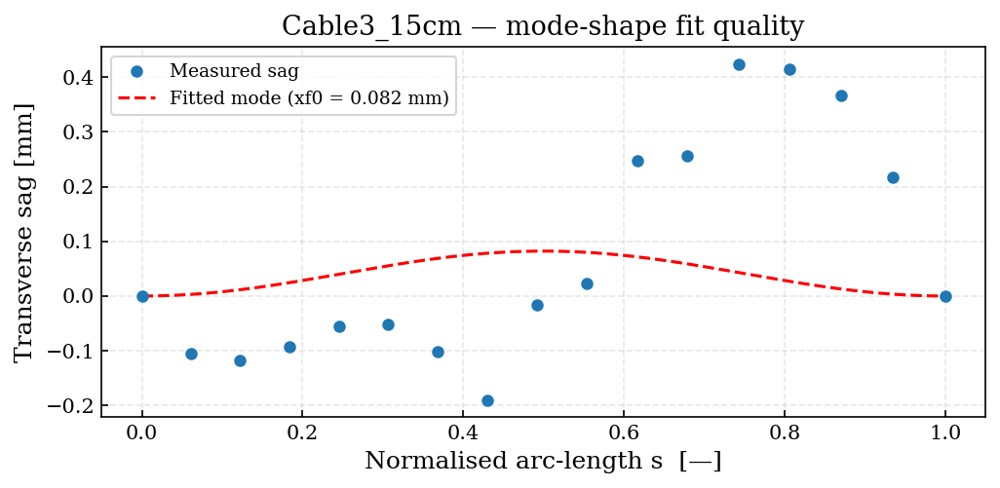

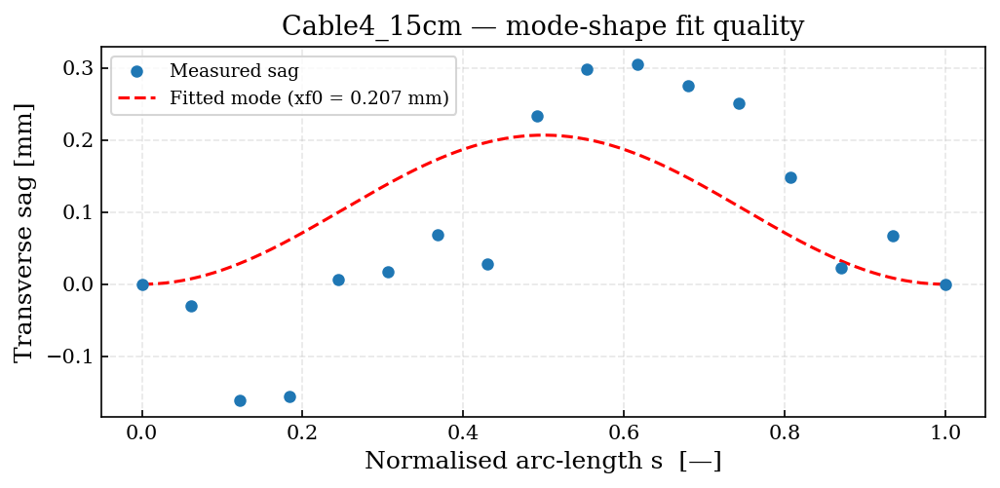

In [72]:
# ── Method 3: Mode-shape projection ─────────────────────────────────────────
#
# IMPORTANT: check the space-time plots and spectrogram first.
# This method is valid only if the cable's transverse deformation is
# dominated by the first symmetric mode (no node at mid-span).
# If you observed higher modes in your animations, limit the frequency band
# before running this (bandpass below the 2nd resonance frequency).

for cfg in DATASETS:
    IL, IR = cfg['idx_left'], cfg['idx_right']

    # --- Fit static profile ---
    xf0, xf_t, s_coords = fit_mode_shape(cfg['XYZ'], IL, IR, disp_z_t=cfg['uz'])
    cfg['xf0_fit'] = xf0
    cfg['xf_t']    = xf_t

    # δxf = xf(t) - xf0  (change in sag amplitude)
    delta_xf = xf_t - xf0
    cfg['delta_xf'] = delta_xf

    # Apply mode-shape projection formula
    delta_xl_mode = strain_mode_projection(
        cfg['delta_L'], xf0, delta_xf, gap_L=cfg['gap_m']
    )
    cfg['delta_xl_mode'] = delta_xl_mode

    print(f"{cfg['label']:20s}  xf0 (fit) = {xf0*1e3:.3f} mm  "
          f"(static sag = {cfg['static_sag']*1e3:.3f} mm)")

# ── Mode-shape fit quality plot ───────────────────────────────────────────────
for cfg in DATASETS:
    IL, IR = cfg['idx_left'], cfg['idx_right']
    _, _, s_coords = fit_mode_shape(cfg['XYZ'], IL, IR)  # get s_coords without fitting time
    s_fine = np.linspace(0, 1, 200)

    gap_idx = slice(IL, IR + 1)
    z_gap   = cfg['XYZ'][gap_idx, 2]
    z_chord = np.linspace(cfg['XYZ'][IL, 2], cfg['XYZ'][IR, 2], len(z_gap))
    z_sag   = z_gap - z_chord

    fig, ax = plt.subplots(figsize=(7, 3.5))
    ax.plot(s_coords, z_sag * 1e3, 'o', ms=5, label='Measured sag', zorder=5)
    ax.plot(s_fine, _phi(s_fine, cfg['xf0_fit']) * 1e3, 'r--',
            label=f'Fitted mode (xf0 = {cfg["xf0_fit"]*1e3:.3f} mm)')
    ax.set_xlabel('Normalised arc-length s  [—]')
    ax.set_ylabel('Transverse sag [mm]')
    ax.set_title(f"{cfg['label']} — mode-shape fit quality")
    ax.legend(fontsize=9)
    plt.tight_layout()
    plt.show()

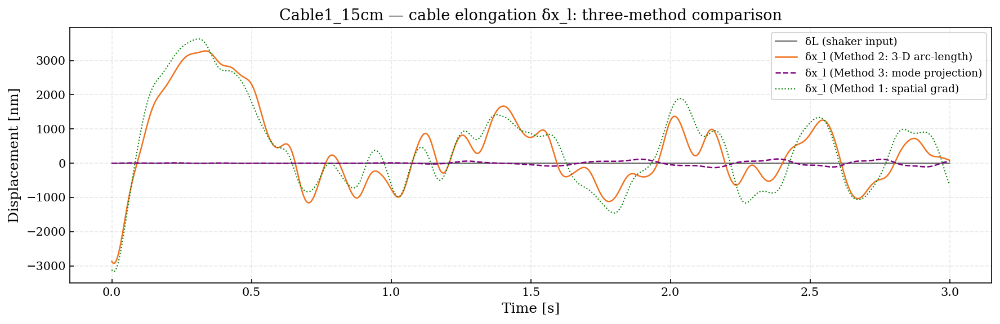

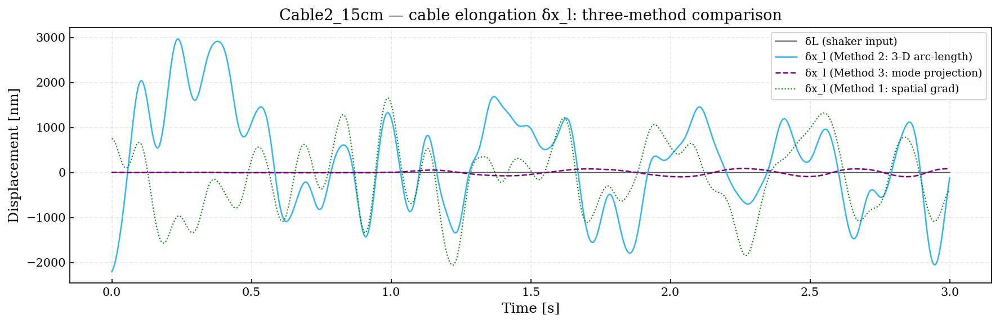

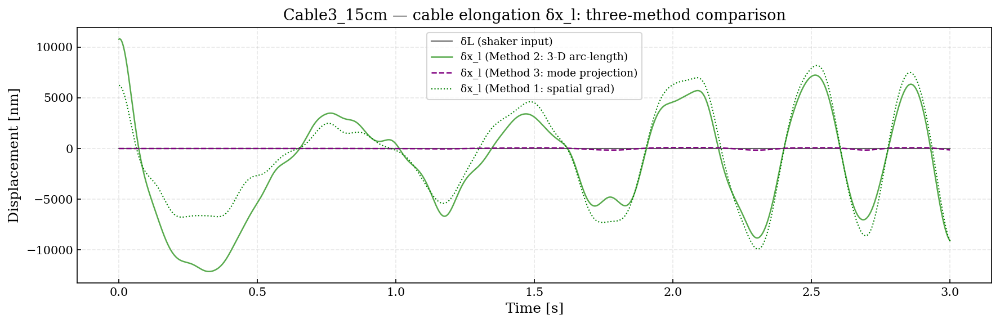

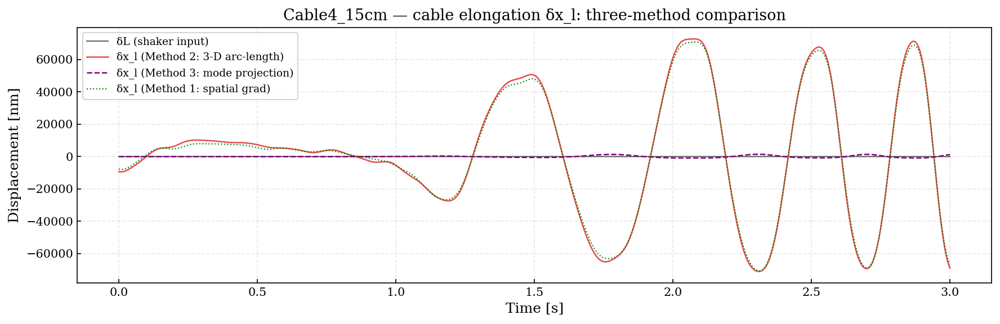

In [73]:
# ── Three-method comparison for one dataset ───────────────────────────────────
#
# If all three methods agree, we have high confidence in the result.
# Divergence between methods reveals model assumptions breaking down:
#   - grad vs arc-length disagree → spatial noise or non-uniform dx
#   - arc-length vs mode differ   → higher-order modes are present

for cfg in DATASETS:
    IL, IR = cfg['idx_left'], cfg['idx_right']
    gap_L  = cfg['x'][IR] - cfg['x'][IL]   # measured gap from coordinates
    tmask  = cfg['t'] <= 3.0

    # Method 1: sum strain_grad over the gap segment, multiply by dx
    # (approximate arc-length from finite-difference strain)
    dx_arr = np.diff(cfg['x'][IL:IR + 1])
    strain_gap = cfg['strain_grad'][:, IL:IR]   # strain at interior points
    # Integrate strain over gap: δx_l ≈ Σ ε_i * dx_i
    delta_xl_grad = np.nansum(strain_gap * dx_arr[np.newaxis, :], axis=1)
    cfg['delta_xl_grad'] = delta_xl_grad

    fig, ax = plt.subplots(figsize=(12, 4))
    col = PALETTE.get(cfg['color'], 'C0')

    ax.plot(cfg['t'][tmask], cfg['delta_L'][tmask] * 1e9,
            'k', lw=1.0, alpha=0.6, label='δL (shaker input)')
    ax.plot(cfg['t'][tmask], cfg['delta_xl_arclength'][tmask] * 1e9,
            color=col, lw=1.2, label='δx_l (Method 2: 3-D arc-length)')
    ax.plot(cfg['t'][tmask], cfg['delta_xl_mode'][tmask] * 1e9,
            color='purple', lw=1.2, ls='--', label='δx_l (Method 3: mode projection)')
    ax.plot(cfg['t'][tmask], delta_xl_grad[tmask] * 1e9,
            color='green', lw=1.0, ls=':', label='δx_l (Method 1: spatial grad)')

    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Displacement [nm]')
    ax.set_title(f"{cfg['label']} — cable elongation δx_l: three-method comparison")
    ax.legend(fontsize=9)
    plt.tight_layout()
    plt.show()

---
## § 9  Strain Transfer Efficiency η(f)

The **spectral coupling efficiency** is computed as:

$$\eta(f) = \frac{|\hat{\delta x}_l(f)|}{|\hat{\delta L}(f)|}$$

where hats denote Fourier transforms. This is the frequency-resolved version of the
broadband average used in Probst et al. (2026) Fig. 2c.

We compute η(f) from **Method 2** (arc-length) as the primary result, and overlay
the theoretical prediction η = 1/(1+Θ) (which is frequency-independent in the quasi-static
regime, but drops and then spikes near resonance).

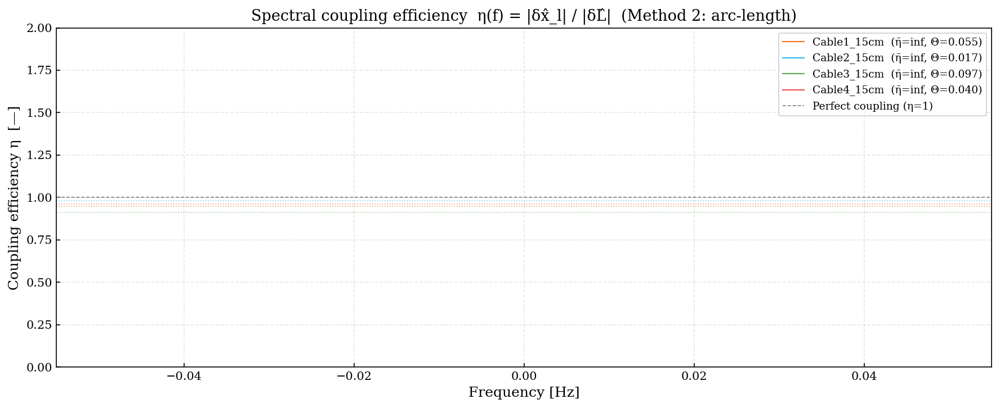

In [74]:
def spectral_efficiency(delta_xl, delta_L, dt, f_min, f_max):
    """
    Compute frequency-resolved coupling efficiency η(f) = |δx̂_l(f)| / |δL̂(f)|.

    A small regularisation floor is added to the denominator to suppress
    noise in frequency bands where the shaker has low output.

    Parameters
    ----------
    delta_xl, delta_L : (N_t,) time-domain signals
    dt                : time step [s]

    Returns
    -------
    freqs : (N_freq,)
    eta   : (N_freq,)
    """
    N     = len(delta_xl)
    freqs = np.fft.rfftfreq(N, d=dt)

    XL = np.abs(np.fft.rfft(delta_xl))
    dL = np.abs(np.fft.rfft(delta_L))

    # Regularisation: use 5 % of max denominator as noise floor
    floor = 0.05 * dL.max()
    eta   = XL / np.maximum(dL, floor)

    mask = (freqs >= f_min) & (freqs <= f_max)
    return freqs[mask], eta[mask]


# ── Compute and store η(f) for all datasets ──────────────────────────────────
for cfg in DATASETS:
    freqs_eta, eta_f = spectral_efficiency(
        cfg['delta_xl_arclength'], cfg['delta_L'],
        cfg['dt'], ETA_FMIN, ETA_FMAX
    )
    eta_mean = float(np.nanmean(eta_f))
    cfg.update(dict(freqs_eta=freqs_eta, eta_f=eta_f, eta_mean=eta_mean))

# ── η(f) line plots ───────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(12, 5))

for cfg in DATASETS:
    col = PALETTE.get(cfg['color'], cfg['color'])
    ax.plot(cfg['freqs_eta'], cfg['eta_f'], color=col, lw=1.0,
            label=f"{cfg['label']}  (η̄={cfg['eta_mean']:.2f}, Θ={cfg['theta_pred']:.3f})")

    # Horizontal dashed line at theoretical quasi-static prediction
    ax.axhline(cfg['eta_pred'], color=col, ls=':', lw=0.8, alpha=0.6)

ax.axhline(1.0, color='gray', ls='--', lw=0.8, label='Perfect coupling (η=1)')
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel('Coupling efficiency η  [—]')
ax.set_title('Spectral coupling efficiency  η(f) = |δx̂_l| / |δL̂|  (Method 2: arc-length)')
ax.set_ylim(0, 2.0)   # >1 allowed — resonance amplification expected above ω₁
ax.legend(fontsize=9)
plt.tight_layout()
plt.show()

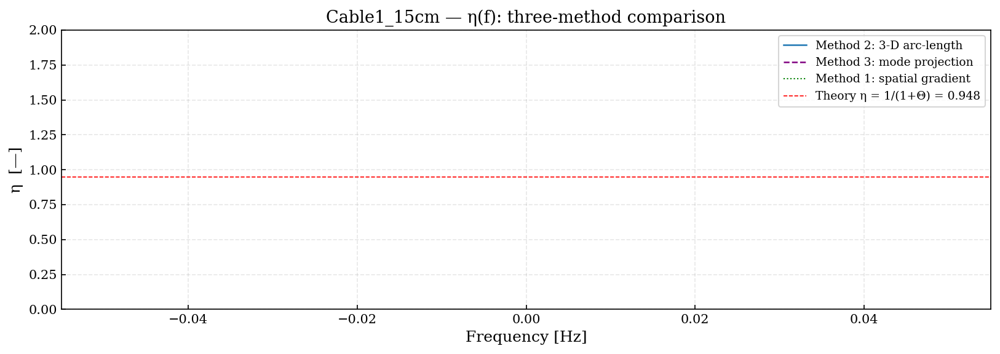

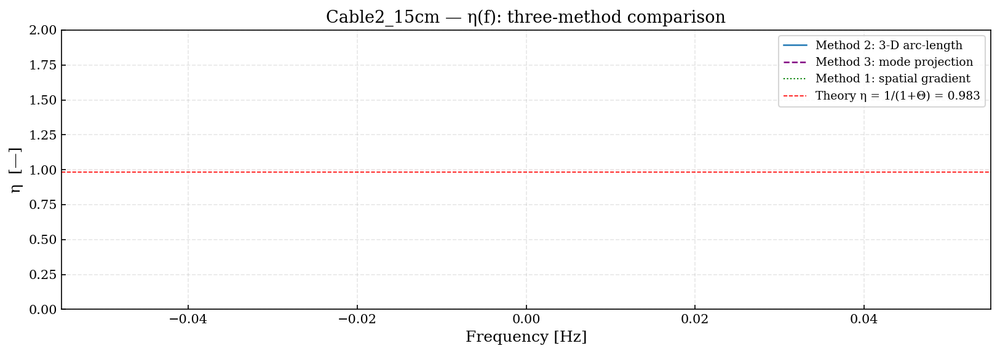

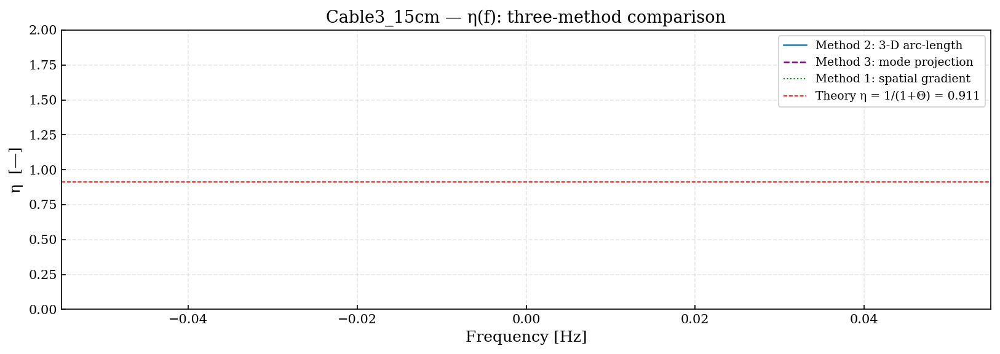

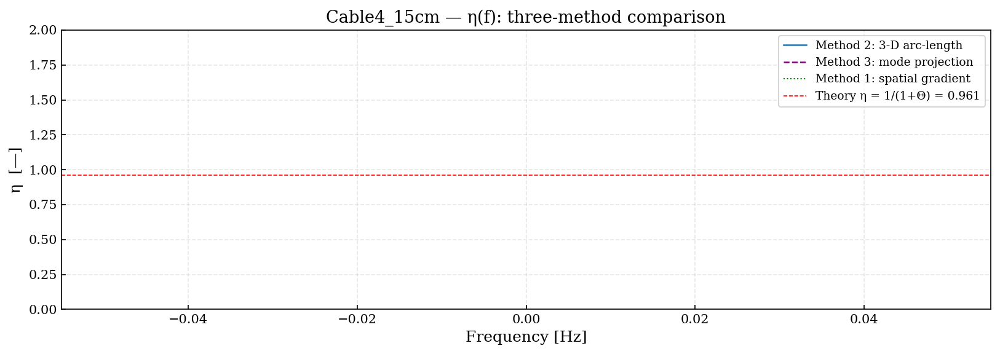

In [75]:
# ── η(f): compare all three methods for one dataset ──────────────────────────
for cfg in DATASETS:
    f_arc, eta_arc = spectral_efficiency(
        cfg['delta_xl_arclength'], cfg['delta_L'], cfg['dt'], ETA_FMIN, ETA_FMAX)
    f_mod, eta_mod = spectral_efficiency(
        cfg['delta_xl_mode'],      cfg['delta_L'], cfg['dt'], ETA_FMIN, ETA_FMAX)
    f_grd, eta_grd = spectral_efficiency(
        cfg['delta_xl_grad'],      cfg['delta_L'], cfg['dt'], ETA_FMIN, ETA_FMAX)

    fig, ax = plt.subplots(figsize=(11, 4))
    ax.plot(f_arc, eta_arc, lw=1.2, label='Method 2: 3-D arc-length')
    ax.plot(f_mod, eta_mod, lw=1.2, ls='--', color='purple', label='Method 3: mode projection')
    ax.plot(f_grd, eta_grd, lw=1.0, ls=':', color='green', label='Method 1: spatial gradient')
    ax.axhline(cfg['eta_pred'], color='red', ls='--', lw=0.8,
               label=f'Theory η = 1/(1+Θ) = {cfg["eta_pred"]:.3f}')
    ax.set_ylim(0, 2.0)
    ax.set_xlabel('Frequency [Hz]'); ax.set_ylabel('η  [—]')
    ax.set_title(f'{cfg["label"]} — η(f): three-method comparison')
    ax.legend(fontsize=9)
    plt.tight_layout()
    plt.show()

---
## § 10  Resonance Identification & Θ Theory Comparison

### Finding the resonance frequency ω₁
The first flexural mode resonance is visible as a **peak in the transverse (z) velocity
spectrum at the cable midpoint**.  Its theoretical prediction from beam theory is:

$$f_1 = \frac{22.4}{2\pi L^2} \sqrt{\frac{EI}{\rho A}}$$

This scales as L⁻², so a 3× longer gap lowers the resonance frequency by 9×.
Identifying f₁ experimentally and comparing to theory validates the mechanical model.

### Θ vs measured η
The final diagnostic: plot all datasets as points in the (Θ, η) plane and overlay
the theoretical curve η = 1/(1+Θ).

Resonance frequency summary:
Dataset                  f₁ measured [Hz]   f₁ theory [Hz]   gap [cm]
Cable1_15cm                         257.1              nan         15
Cable2_15cm                         246.3              nan         15
Cable3_15cm                          65.2              nan         15
Cable4_15cm                          65.1              nan         15


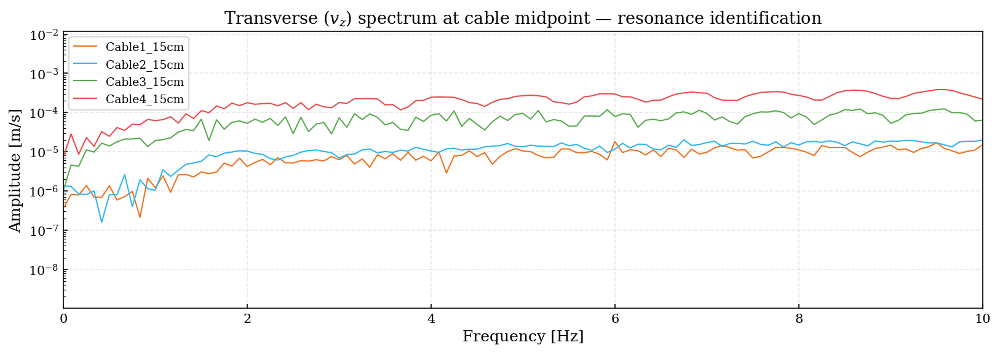

In [76]:
def find_spectral_peak(signal, fs, f_lo, f_hi):
    """
    Find the frequency of the largest spectral peak of `signal` between f_lo and f_hi.
    Returns the peak frequency [Hz] and the spectral amplitude at that frequency.
    """
    freqs, amp = amplitude_spectrum(signal[:, np.newaxis], fs)
    amp = amp.ravel()
    mask = (freqs >= f_lo) & (freqs <= f_hi)
    if not mask.any():
        return np.nan, np.nan
    idx_peak = np.argmax(amp[mask])
    return freqs[mask][idx_peak], amp[mask][idx_peak]


def f1_beam_theory(gap_L, E_eff, rho_lin, radius_m):
    """
    First flexural natural frequency [Hz] of a doubly-clamped beam:
        f₁ = (22.4 / 2π) * (1/L²) * sqrt(EI / ρA)
    Parameters use effective (measured) values for the cable cross-section.
    """
    A  = np.pi * radius_m**2
    I  = np.pi * radius_m**4 / 4.0
    rho_vol = rho_lin / A   # volumetric density [kg/m³]
    return (22.4 / (2 * np.pi)) * (1.0 / gap_L**2) * np.sqrt(E_eff * I / (rho_vol * A))


# ── Identify experimental resonance from the midpoint z-spectrum ─────────────
print("Resonance frequency summary:")
print(f"{'Dataset':22s} {'f₁ measured [Hz]':>18} {'f₁ theory [Hz]':>16} {'gap [cm]':>10}")

for cfg in DATASETS:
    IL, IR = cfg['idx_left'], cfg['idx_right']
    mid    = (IL + IR) // 2
    vz_mid = cfg['vz'][:, mid]

    # Search for peak in transverse spectrum (z-component at midpoint)
    # Limit to a reasonable range: 5 Hz to 300 Hz
    f1_meas, amp_peak = find_spectral_peak(vz_mid, cfg['fs'], f_lo=5.0, f_hi=300.0)
    cfg['f1_measured'] = f1_meas

    # Theoretical prediction — look up properties if available
    cable_key = next((k for k in CABLE_PROPERTIES if k in cfg['label']), None)
    if cable_key:
        cp = CABLE_PROPERTIES[cable_key]
        f1_theory = f1_beam_theory(cfg['gap_m'], cp['E_eff'], cp['rho_lin'], cp['radius_m'])
    else:
        f1_theory = np.nan
    cfg['f1_theory'] = f1_theory

    print(f"{cfg['label']:22s} {f1_meas:>18.1f} {f1_theory:>16.1f} {cfg['gap_m']*100:>10.0f}")

# ── Transverse midpoint spectra: see the resonance peaks ─────────────────────
fig, ax = plt.subplots(figsize=(11, 4))
for cfg in DATASETS:
    mid = (cfg['idx_left'] + cfg['idx_right']) // 2
    freqs, amp = amplitude_spectrum(cfg['vz'][:, mid:mid+1], cfg['fs'])
    col = PALETTE.get(cfg['color'], cfg['color'])
    ax.semilogy(freqs, amp.ravel(), color=col, lw=1.0, label=cfg['label'])
    if not np.isnan(cfg['f1_measured']):
        ax.axvline(cfg['f1_measured'], color=col, ls='--', lw=0.8, alpha=0.7)
ax.set_xlim(0, BP_FMAX)
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel('Amplitude [m/s]')
ax.set_title('Transverse ($v_z$) spectrum at cable midpoint — resonance identification')
ax.legend(fontsize=9)
plt.tight_layout()
plt.show()

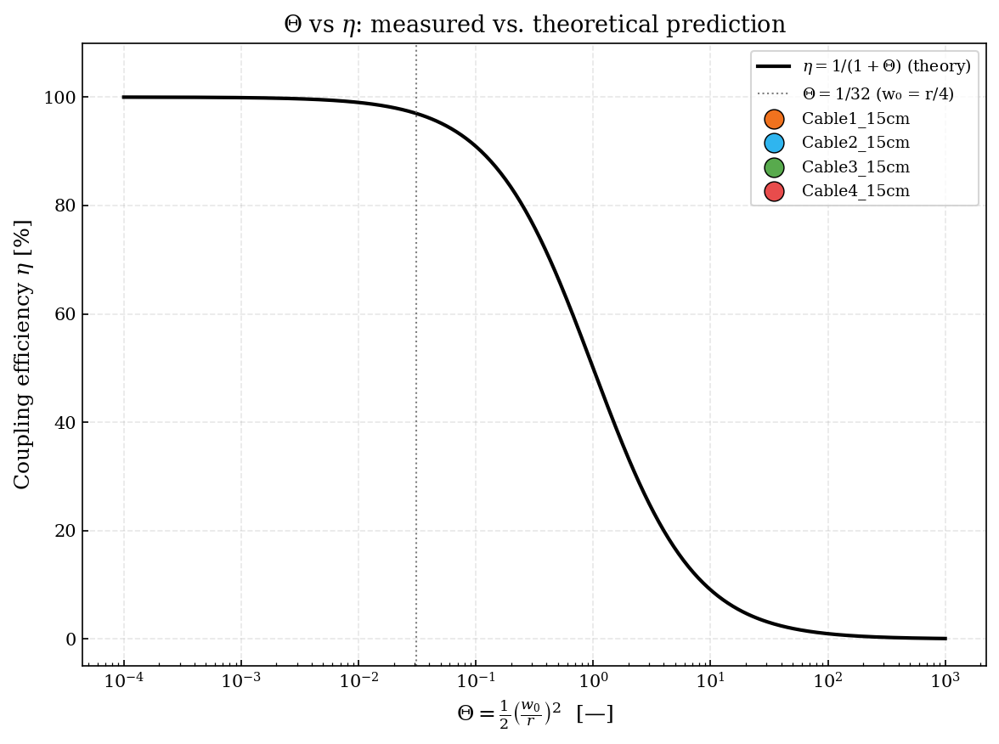

In [77]:
# ── Θ vs measured η scatter plot  ─────────────────────────────────────────────
#
# Each dataset = one dot.  Overlay the theoretical curve η = 1/(1+Θ).
# If the model is correct, all points should fall close to the curve.
#
# NOTE: use the BROADBAND mean η (averaged over ETA_FMIN–ETA_FMAX) as the
# single number per dataset, consistent with Probst et al. Fig. 2c.

theta_range = np.logspace(-4, 3, 500)
eta_theory  = 1.0 / (1.0 + theta_range)

fig, ax = plt.subplots(figsize=(8, 6))
ax.semilogx(theta_range, eta_theory * 100, 'k-', lw=2, label=r'$\eta = 1/(1+\Theta)$ (theory)')

# Critical Θ = 1/32 (w₀/r = 1/4)
ax.axvline(1/32, color='gray', ls=':', lw=1.0, label=r'$\Theta = 1/32$ (w₀ = r/4)')

for cfg in DATASETS:
    col = PALETTE.get(cfg['color'], cfg['color'])
    ax.scatter(cfg['theta_pred'], cfg['eta_mean'] * 100,
               s=120, color=col, zorder=5, edgecolors='k', linewidths=0.7,
               label=cfg['label'])
    ax.annotate(
        cfg['label'],
        xy=(cfg['theta_pred'], cfg['eta_mean'] * 100),
        xytext=(6, 4), textcoords='offset points', fontsize=8
    )

ax.set_xlabel(r'$\Theta = \frac{1}{2}\left(\frac{w_0}{r}\right)^2$  [—]')
ax.set_ylabel(r'Coupling efficiency $\eta$ [%]')
ax.set_ylim(-5, 110)
ax.set_title(r'$\Theta$ vs $\eta$: measured vs. theoretical prediction')
ax.legend(fontsize=9, loc='upper right')
plt.tight_layout()
plt.show()

---
## § 11  Multi-Dataset Summary Plots

These plots bring all experiments together for the thesis figures:

1. **η̄ bar chart** — mean broadband coupling per cable and gap length  
2. **η(f) overlay** — all datasets on one axes, coloured by gap length  
3. **Bending-to-axial ratio** — how much the cable bends vs. stretches  
4. **Resonance frequency vs. gap** — compare to L⁻² scaling  

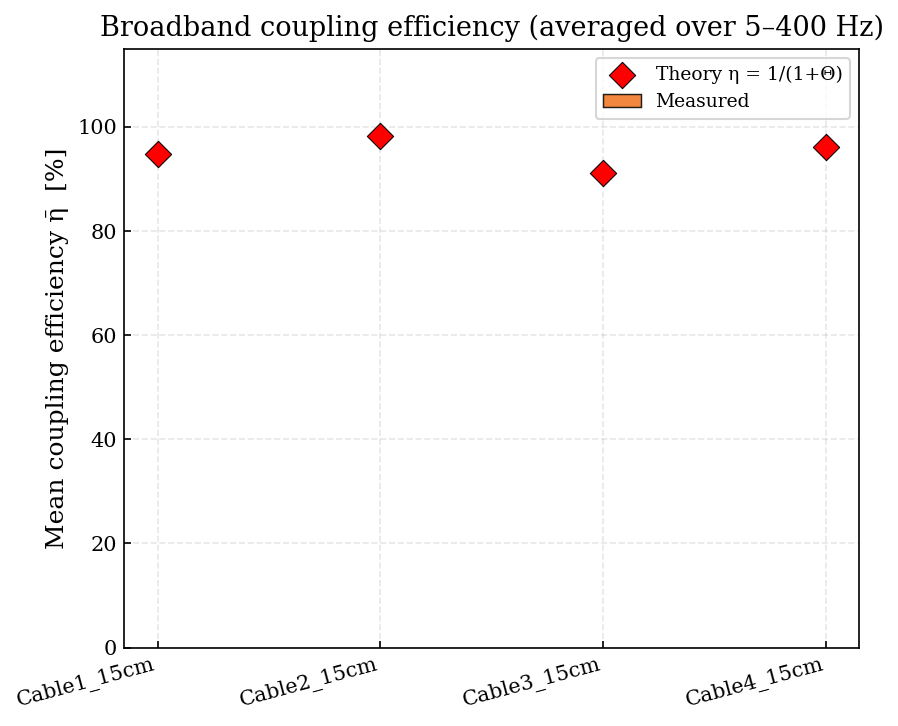

In [78]:
# ── 11.1  Mean η bar chart ────────────────────────────────────────────────────
labels     = [cfg['label']    for cfg in DATASETS]
eta_means  = [cfg['eta_mean'] * 100 for cfg in DATASETS]
eta_theory_vals = [cfg['eta_pred'] * 100 for cfg in DATASETS]
colors     = [PALETTE.get(cfg['color'], cfg['color']) for cfg in DATASETS]

fig, ax = plt.subplots(figsize=(max(6, 1.5 * len(DATASETS)), 5))
x_pos = np.arange(len(labels))
bars = ax.bar(x_pos, eta_means, color=colors, alpha=0.85, edgecolor='k', lw=0.7, label='Measured')
ax.scatter(x_pos, eta_theory_vals, s=80, marker='D', color='red', zorder=5,
           edgecolors='k', lw=0.5, label='Theory η = 1/(1+Θ)')

for bar, v in zip(bars, eta_means):
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 1.5,
            f'{v:.1f}%', ha='center', va='bottom', fontsize=9)

ax.set_xticks(x_pos); ax.set_xticklabels(labels, rotation=15, ha='right')
ax.set_ylabel('Mean coupling efficiency η̄  [%]')
ax.set_ylim(0, 115)
ax.set_title(f'Broadband coupling efficiency (averaged over {ETA_FMIN:.0f}–{ETA_FMAX:.0f} Hz)')
ax.legend(fontsize=9)
plt.tight_layout()
plt.show()

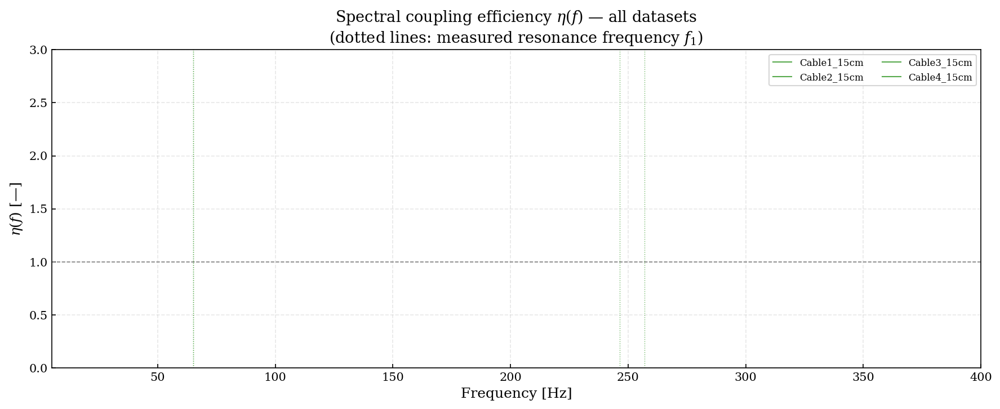

In [79]:
# ── 11.2  η(f) all datasets on one axes ──────────────────────────────────────
#
# Colour by gap length so the shift of the resonance peak with L is visible.
# This directly mirrors Fig. 3c of the theory paper.

gap_colors = {0.05: '#F0721E', 0.10: '#2FB5EF', 0.15: '#58AA4D'}   # one colour per gap

fig, ax = plt.subplots(figsize=(12, 5))
ax.axhline(1.0, color='gray', ls='--', lw=0.8)

for cfg in DATASETS:
    col = gap_colors.get(cfg['gap_m'], PALETTE.get(cfg['color'], 'k'))
    ax.plot(cfg['freqs_eta'], cfg['eta_f'], color=col, lw=1.0, label=cfg['label'])
    if not np.isnan(cfg.get('f1_measured', np.nan)):
        ax.axvline(cfg['f1_measured'], color=col, ls=':', lw=0.7, alpha=0.8)

ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel(r'$\eta(f)$ [—]')
ax.set_ylim(0, 3.0)   # allow >1 for resonance amplification
ax.set_xlim(ETA_FMIN, ETA_FMAX)
ax.set_title(r'Spectral coupling efficiency $\eta(f)$ — all datasets'
             '\n(dotted lines: measured resonance frequency $f_1$)')
ax.legend(fontsize=8, ncol=2)
plt.tight_layout()
plt.show()

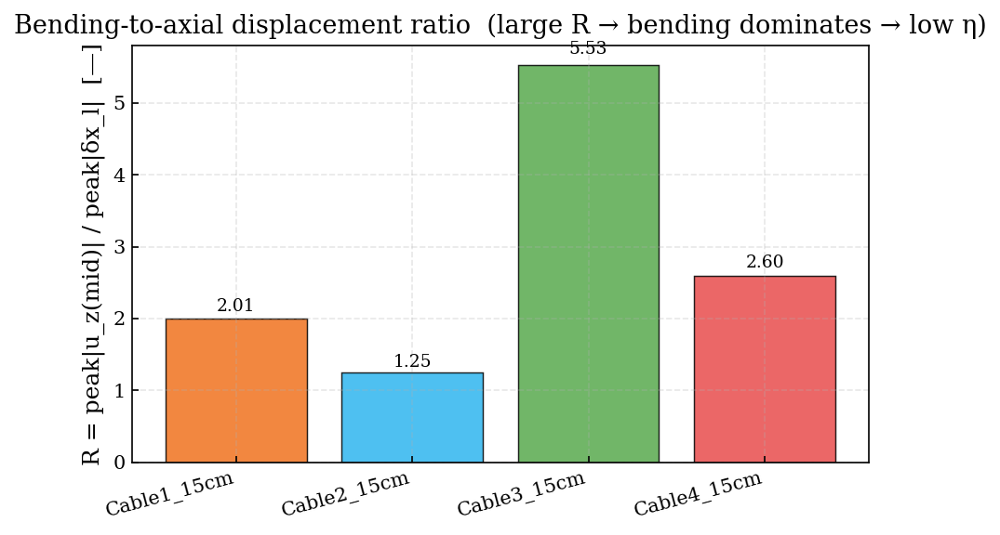

In [80]:
# ── 11.3  Bending-to-axial displacement ratio ─────────────────────────────────
#
# R = peak(|u_z| at midpoint) / peak(|δx_l|)
# Large R → cable bends a lot but barely elongates axially → low η.
# Expected trend: R increases with gap length and with thin/flexible cables.

labels_r = []; R_vals = []; colors_r = []

for cfg in DATASETS:
    mid = (cfg['idx_left'] + cfg['idx_right']) // 2
    uz_mid  = cfg['uz'][:, mid]
    R = np.abs(uz_mid).max() / (np.abs(cfg['delta_xl_arclength']).max() + 1e-30)
    labels_r.append(cfg['label'])
    R_vals.append(R)
    colors_r.append(PALETTE.get(cfg['color'], cfg['color']))
    cfg['bending_ratio'] = R

fig, ax = plt.subplots(figsize=(max(6, 1.5 * len(DATASETS)), 4))
bars = ax.bar(labels_r, R_vals, color=colors_r, alpha=0.85, edgecolor='k', lw=0.7)
for bar, v in zip(bars, R_vals):
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() * 1.02,
            f'{v:.2f}', ha='center', va='bottom', fontsize=9)
ax.set_ylabel('R = peak|u_z(mid)| / peak|δx_l|  [—]')
ax.set_title('Bending-to-axial displacement ratio  (large R → bending dominates → low η)')
plt.xticks(rotation=15, ha='right')
plt.tight_layout()
plt.show()

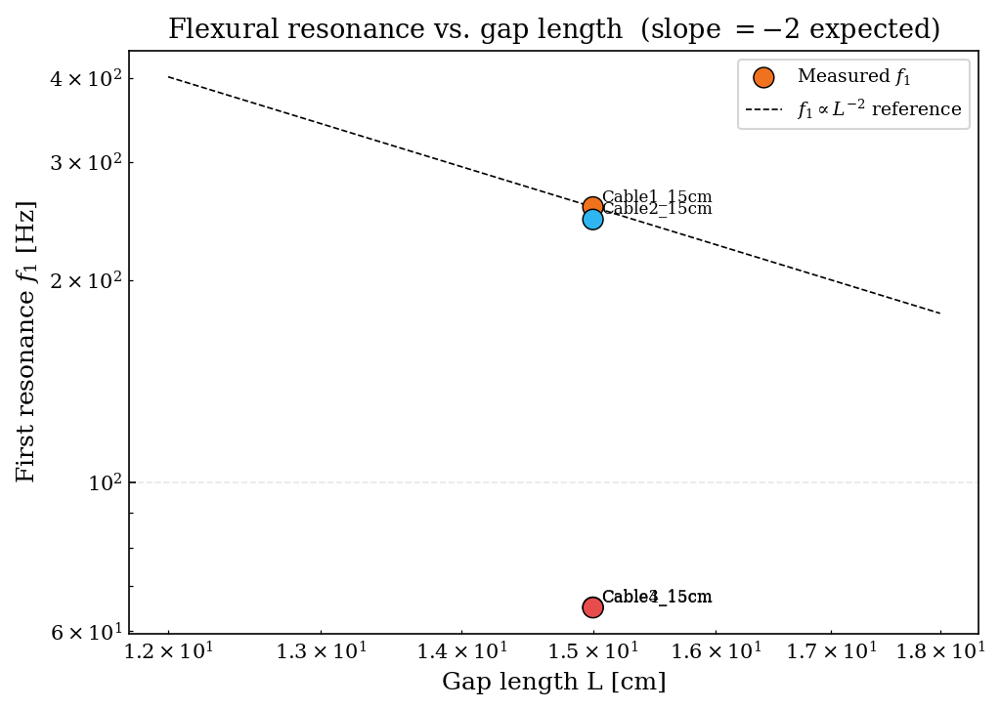

In [81]:
# ── 11.4  Resonance frequency vs. gap length ──────────────────────────────────
#
# The first flexural mode frequency scales as 1/L².  Plotting f₁ vs L on
# log–log axes should give a straight line with slope −2 if beam theory is valid.
# Deviation from slope −2 would indicate non-ideal boundary conditions or
# tension effects modifying the effective stiffness.

gaps_m    = np.array([cfg['gap_m']         for cfg in DATASETS])
f1_meas   = np.array([cfg.get('f1_measured', np.nan) for cfg in DATASETS])
f1_th     = np.array([cfg.get('f1_theory',  np.nan)  for cfg in DATASETS])
colors_res = [PALETTE.get(cfg['color'], cfg['color']) for cfg in DATASETS]

fig, ax = plt.subplots(figsize=(7, 5))

valid = ~np.isnan(f1_meas) & ~np.isnan(gaps_m)
if valid.any():
    ax.scatter(gaps_m[valid] * 100, f1_meas[valid],
               s=100, c=np.array(colors_res)[valid],
               edgecolors='k', lw=0.7, zorder=5, label='Measured $f_1$')
    for i, cfg in enumerate(DATASETS):
        if valid[i]:
            ax.annotate(cfg['label'],
                        xy=(gaps_m[i]*100, f1_meas[i]),
                        xytext=(4, 3), textcoords='offset points', fontsize=8)

if ~np.isnan(f1_th).all():
    ax.scatter(gaps_m * 100, f1_th,
               s=60, marker='D', c='none', edgecolors='red', lw=1.2,
               zorder=5, label='Theory $f_1$')

# Overlay L⁻² reference line through first valid point
valid_idx = np.where(valid)[0]
if len(valid_idx) >= 2:
    L_ref  = gaps_m[valid_idx[0]]
    f_ref  = f1_meas[valid_idx[0]]
    L_line = np.linspace(gaps_m[valid].min() * 0.8, gaps_m[valid].max() * 1.2, 100)
    f_line = f_ref * (L_ref / L_line)**2
    ax.plot(L_line * 100, f_line, 'k--', lw=0.8, label=r'$f_1 \propto L^{-2}$ reference')

ax.set_xscale('log'); ax.set_yscale('log')
ax.set_xlabel('Gap length L [cm]')
ax.set_ylabel('First resonance $f_1$ [Hz]')
ax.set_title(r'Flexural resonance vs. gap length  (slope $= -2$ expected)')
ax.legend(fontsize=9)
plt.tight_layout()
plt.show()

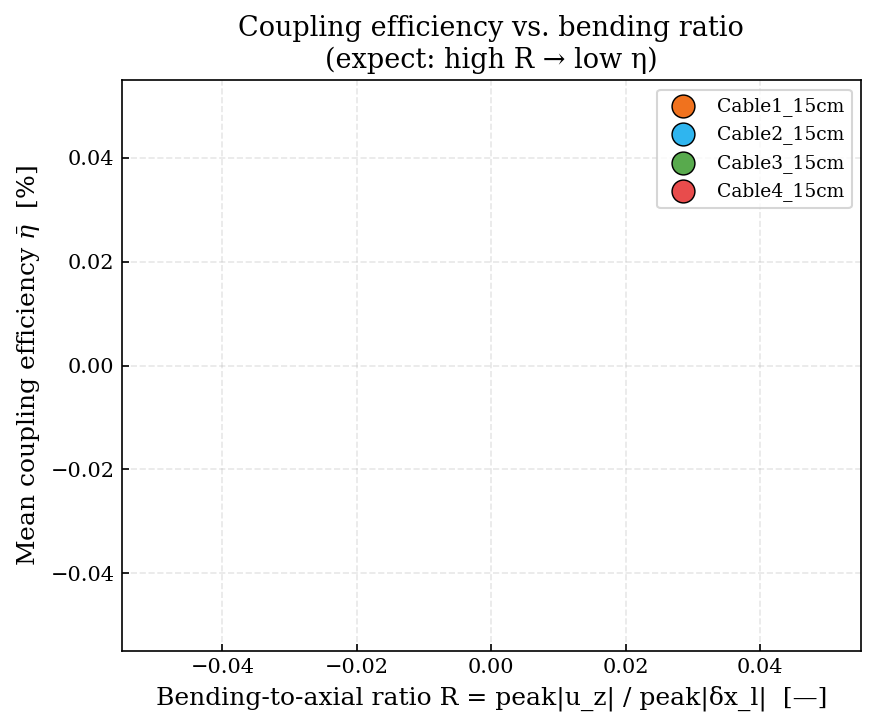


Dataset                gap [cm]        Θ   η_theory    η̄_meas   R_bend   f₁_meas [Hz]
-------------------------------------------------------------------------------------
Cable1_15cm                  15   0.0554       94.8        inf    2.005          257.1
Cable2_15cm                  15   0.0174       98.3        inf    1.249          246.3
Cable3_15cm                  15   0.0975       91.1        inf    5.527           65.2
Cable4_15cm                  15   0.0405       96.1        inf    2.600           65.1


In [83]:
# ── 11.5  η̄ vs bending ratio R — scatter ─────────────────────────────────────
#
# If bending is the dominant loss mechanism (as the theory predicts),
# you should see a negative correlation: high R → low η̄.
# This plot directly tests that hypothesis with the experimental data.

fig, ax = plt.subplots(figsize=(6, 5))

for cfg in DATASETS:
    col = PALETTE.get(cfg['color'], cfg['color'])
    ax.scatter(cfg['bending_ratio'], cfg['eta_mean'] * 100,
               s=120, color=col, zorder=5,
               edgecolors='k', lw=0.7, label=cfg['label'])
    ax.annotate(cfg['label'],
                xy=(cfg['bending_ratio'], cfg['eta_mean'] * 100),
                xytext=(5, 3), textcoords='offset points', fontsize=8)

ax.set_xlabel('Bending-to-axial ratio R = peak|u_z| / peak|δx_l|  [—]')
ax.set_ylabel(r'Mean coupling efficiency $\bar{\eta}$  [%]')
ax.set_title('Coupling efficiency vs. bending ratio\n(expect: high R → low η)')
ax.legend(fontsize=9)
plt.tight_layout()
plt.show()

# ── Print final summary table ─────────────────────────────────────────────────
print("\n" + "=" * 85)
print(f"{'Dataset':22s} {'gap [cm]':>8} {'Θ':>8} {'η_theory':>10} "
      f"{'η̄_meas':>10} {'R_bend':>8} {'f₁_meas [Hz]':>14}")
print("-" * 85)
for cfg in DATASETS:
    print(f"{cfg['label']:22s} "
          f"{cfg['gap_m']*100:>8.0f} "
          f"{cfg['theta_pred']:>8.4f} "
          f"{cfg['eta_pred']*100:>10.1f} "
          f"{cfg['eta_mean']*100:>10.1f} "
          f"{cfg.get('bending_ratio', np.nan):>8.3f} "
          f"{cfg.get('f1_measured', np.nan):>14.1f}")
print("=" * 85)